In [ ]:
1

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import duckdb
from concurrent.futures import ThreadPoolExecutor, as_completed
import dask.dataframe as dd
import sys
import glob
import os

sys.path.append("/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/")
from scripts import initial_map, map_refiner, complexity, finder, preprocess, error_correct, plotting, umi_deduplicate, pipelines


from tqdm import tqdm  # progress bar

# Control variables

In [3]:
step1_ADBC2 = finder.Barcode(name = "ADBC2",
                       preceder = "CTCGAGATAACTTCGTATAATGTATGCTAT",
                       post = "GGCCGGCCATAGGGCCCC",
                       length = 6)

step1_HawkBCs = finder.Barcode(name = "HawkBCs",
                       preceder = "GAGCTCGCTAGC",
                       post = "CTCGAGATAA",
                       length = 9)

step1_RTBC = finder.Barcode(name = "RTBC",
                       preceder = "GGCCGGCCATAGGGCCCC",
                       post = "GCGGTCCA",
                       length = 16)

step1_AD = finder.Barcode(name = "AD",
                       preceder = "CACCATG",
                       post = "GGATCCG",
                       length = 162)

In [4]:
pipeline_no_err_corr = pipelines.TreblPipeline(db_path = "../../duckdb/NKX2-2_pipeline_test_no_err_corr.db",
                        design_file_path = "../../data/DNA_Tiles_nkx2_2.txt",
                        error_correction = False,
                        output_path = "../../output/NKX2-2/pipeline_test/no_err_corr")

pipeline_err_corr = pipelines.TreblPipeline(db_path = "../../duckdb/NKX2-2_pipeline_test_err_corr.db",
                        design_file_path = "../../data/DNA_Tiles_nkx2_2.txt",
                        error_correction = True,
                        output_path = "../../output/NKX2-2/pipeline_test/err_corr")

# Step 1

## No error correction

✓ Initial map already exists: step1_ADBC2_HawkBCs_RTBC_AD_initial — skipping
Base prefix (stable across descriptors): step1_ADBC2_HawkBCs_RTBC_AD_
Full prefix for this instance: step1_ADBC2_HawkBCs_RTBC_AD_

Using the following step order:
1. initial
2. grouped
3. thresholded
4. barcode_exists
5. unique_target
6. quality
7. designed

Grouping step1_ADBC2_HawkBCs_RTBC_AD_initial...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

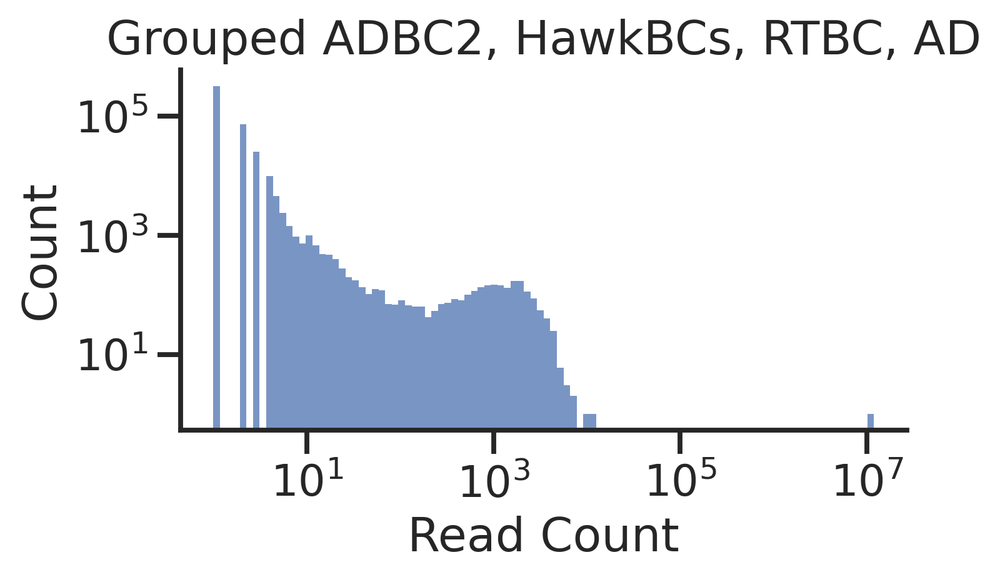

Done in 6.94 seconds.

Thresholding...
Using reads threshold of 100.


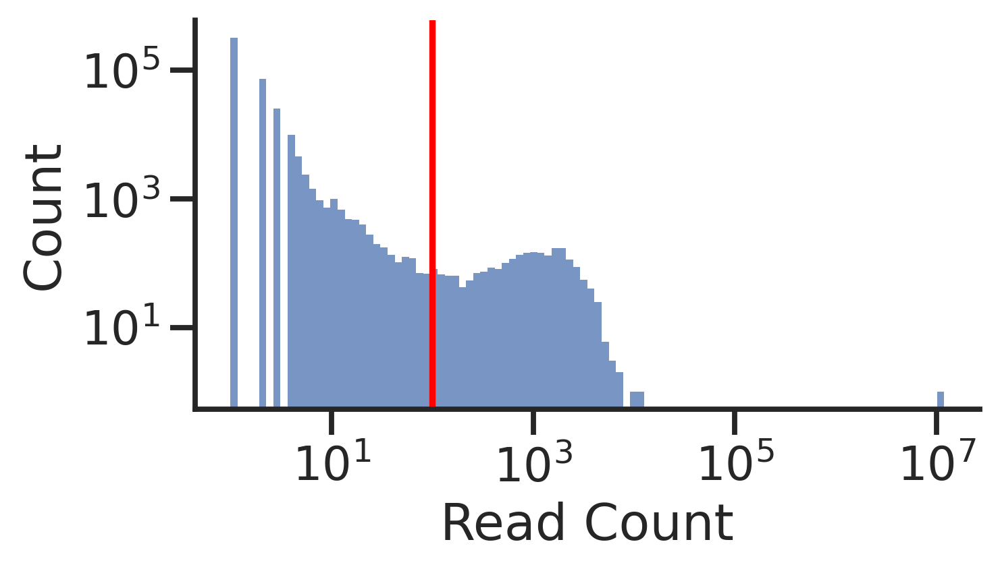

Done in 3.17 seconds.

Removing rows with null or empty barcodes (excluding AD)...
Done in 0.02 seconds.

Filtering so that at least 90% of reads come from the most abundant target...
	Processing mapping 1: ADBC2 || '-' || HawkBCs → AD
	Processing mapping 2: RTBC → ADBC2 || '-' || HawkBCs
Created filtered table: step1_ADBC2_HawkBCs_RTBC_AD_unique_target
Done in 0.06 seconds.


Filtering to high-quality reads...
Created table: step1_ADBC2_HawkBCs_RTBC_AD_quality — filtered for TRUE in all *_qual columns.
Done in 0.01 seconds.


Filtering to designed sequences...
Created table: step1_ADBC2_HawkBCs_RTBC_AD_designed — kept only Designed == 1.
Done in 0.01 seconds.

Done.
Saved loss summary table as 'step1_ADBC2_HawkBCs_RTBC_AD_loss_summary'
Done in 0.21 seconds.



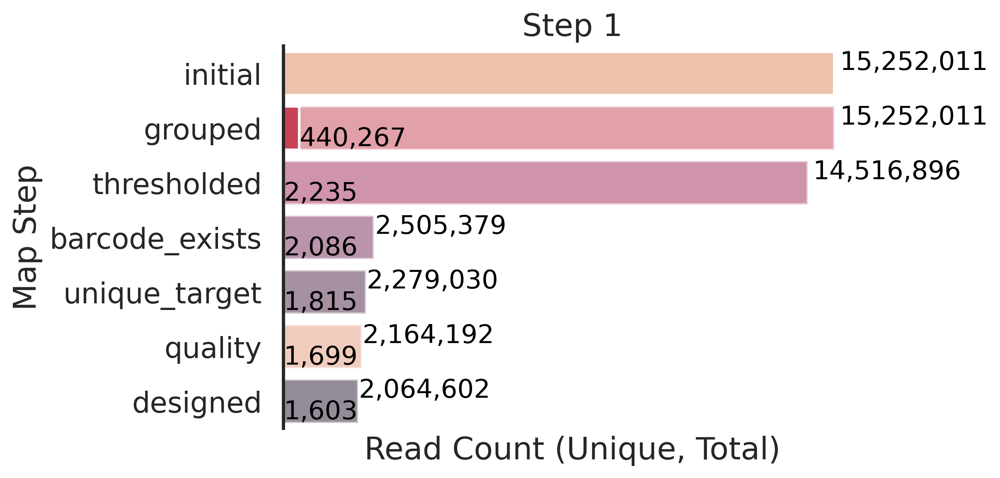

In [13]:
step1_map_no_err_corr = pipeline_no_err_corr.run_step_1(seq_file = ['/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/S1_czb/TL4_S1_and_gDNA_RP48hr_puro_rep1_S21.fastq.gz.assembled.fastq'],
                    bc_objects = [step1_ADBC2, step1_HawkBCs, step1_RTBC, step1_AD],
                    column_pairs = [(("ADBC2", "HawkBCs"), "AD"), ( "RTBC", ("ADBC2", "HawkBCs"))],
                    reads_threshold = 100,
                    reverse_complement = False)

In [14]:
step1_map_no_err_corr

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4181,True,True,True,True,1
1,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,3871,True,True,True,True,1
2,AACAAA,CCGATCTAT,TGCTGAGTGTCGAATT,ACCGACTTCATCGACGAGGAGGTGCTGATGAGCCTGGTGATCGAGA...,3694,True,True,True,True,1
3,ACGTAT,AGTGTGCGT,ACAGGCTGTCGCTACC,GCCCAGGACCTGGCCGCCGCCAAGTTCCAGGCCGGCATTCCCTTCA...,3673,True,True,True,True,1
4,ACGTTA,CCGTGATAC,TGTGCCAATCAAGGCA,ACCGACGCCATCGACGAGGAGGTGGCCATGAGCGCCGTGATCGAGA...,3665,True,True,True,True,1
...,...,...,...,...,...,...,...,...,...,...
1598,AGAGTC,AACCAGAAC,TGCAAATTTATCCCCA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,131,True,True,True,True,1
1599,TATATA,AGCATCATC,CAAAATCGCGTATATA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATCTATCCCA...,125,True,True,True,True,1
1600,TTAAGA,ACCTCGATT,ATAATATAAAATCTTT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,125,True,True,True,True,1
1601,CCGGTA,ACAAGTGGA,ACTCACTTTAAAGTTT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,121,True,True,True,True,1


## With automatic error correction

✓ Initial map already exists: step1_ADBC2_HawkBCs_RTBC_AD_initial — skipping
Base prefix (stable across descriptors): step1_ADBC2_HawkBCs_RTBC_AD_
Full prefix for this instance: step1_ADBC2_HawkBCs_RTBC_AD_

Using the following step order:
1. initial
2. barcode_exists
3. quality
4. error_corrected
5. grouped
6. thresholded
7. unique_target
8. designed

Removing rows with null or empty barcodes (excluding AD)...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 7.04 seconds.


Filtering to high-quality reads...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Created table: step1_ADBC2_HawkBCs_RTBC_AD_quality — filtered for TRUE in all *_qual columns.
Done in 10.30 seconds.


=== Running error correction step on step1_ADBC2_HawkBCs_RTBC_AD_quality ===

=== Applying whitelist for step1 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/figures/step1_ADBC2_HawkBCs_RTBC_AD_filtered_barcodes_extracted.fastq


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Wrote 2915005 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/figures/step1_ADBC2_HawkBCs_RTBC_AD_filtered_barcodes_extracted.fastq
Done in 8.33 seconds.

Using automatic detection of expected barcode count.
Running umi_tools whitelist...
Running umi_tools whitelist on step1_ADBC2_HawkBCs_RTBC_AD_filtered_barcodes_extracted.fastq ...


/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/figures/step1_ADBC2_HawkBCs_RTBC_AD_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/figures/step1_ADBC2_HawkBCs_RTBC_AD_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/figures/step1_ADBC2_HawkBCs_RTBC_AD_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1757


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Merging with design file...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 12.20 seconds.

Whitelist application complete for step1 at step1_ADBC2_HawkBCs_RTBC_AD_error_corrected
Done in 8.45 minutes.

Grouping step1_ADBC2_HawkBCs_RTBC_AD_error_corrected...


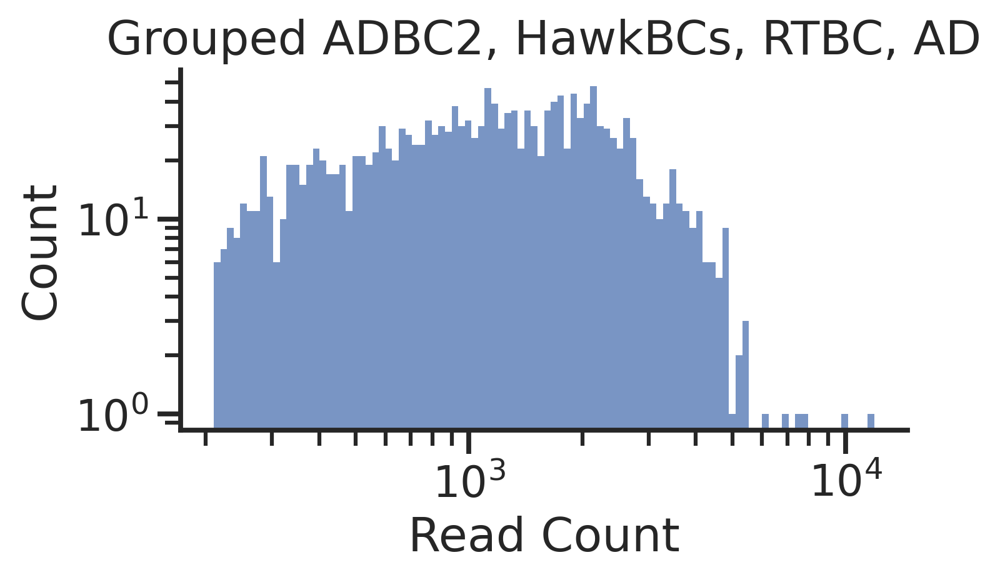

Done in 2.53 seconds.

Thresholding...
Using reads threshold of 1.


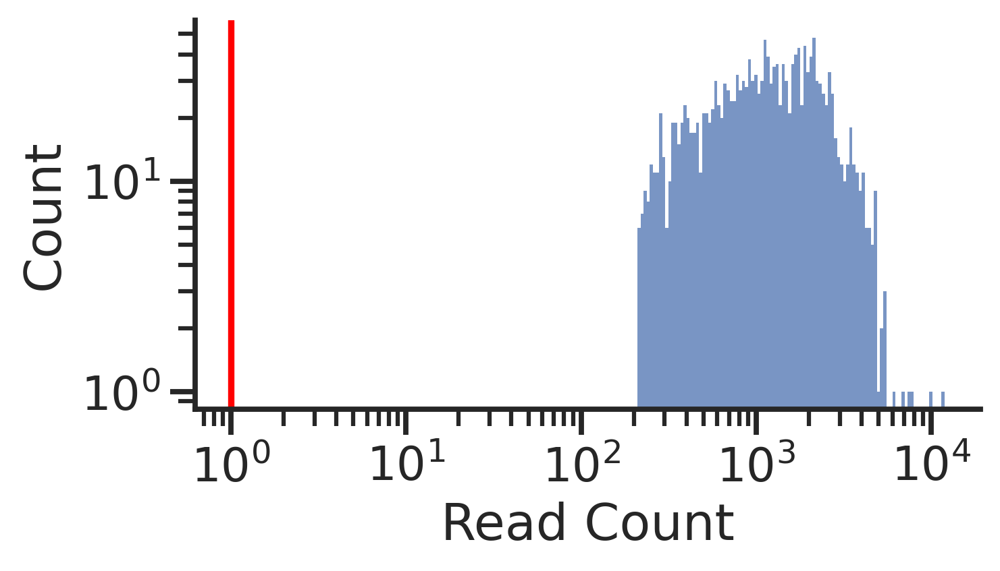

Done in 2.39 seconds.

Filtering so that at least 90% of reads come from the most abundant target...
	Processing mapping 1: ADBC2 || '-' || HawkBCs → AD
	Processing mapping 2: RTBC → ADBC2 || '-' || HawkBCs
Created filtered table: step1_ADBC2_HawkBCs_RTBC_AD_unique_target
Done in 0.06 seconds.


Filtering to designed sequences...
Created table: step1_ADBC2_HawkBCs_RTBC_AD_designed — kept only Designed == 1.
Done in 0.02 seconds.

Done.
Saved loss summary table as 'step1_ADBC2_HawkBCs_RTBC_AD_loss_summary'
Done in 0.18 seconds.



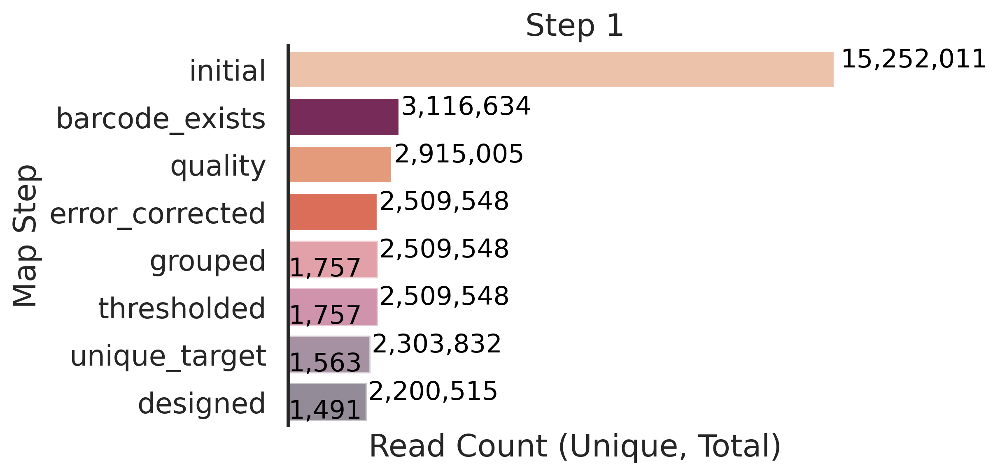

In [21]:
step1_map_err_corr = pipeline_err_corr.run_step_1(seq_file = ['/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/S1_czb/TL4_S1_and_gDNA_RP48hr_puro_rep1_S21.fastq.gz.assembled.fastq'],
                    bc_objects = [step1_ADBC2, step1_HawkBCs, step1_RTBC, step1_AD],
                    column_pairs = [(("ADBC2", "HawkBCs"), "AD"), ( "RTBC", ("ADBC2", "HawkBCs"))],
                    reads_threshold = 1,
                    reverse_complement = False)

In [22]:
step1_map_err_corr

,ADBC2,HawkBCs,RTBC,AD,count,ADBC2_qual,HawkBCs_qual,RTBC_qual,AD_qual,Designed
0,TGTACA,ATTCTCGCC,ATACGATGATTAATAT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCG...,4432,True,True,True,True,1
1,GTAATC,CAGCGGTAT,CCCCAGGCACTATAAG,GCCCAGGACCTGGACGACGACACCTTCCAGGCCGGCATTCCCTTCA...,4129,True,True,True,True,1
2,ACGTAT,AGTGTGCGT,ACAGGCTGTCGCTACC,GCCCAGGACCTGGCCGCCGCCAAGTTCCAGGCCGGCATTCCCTTCA...,3896,True,True,True,True,1
3,TCAGTA,ACCGTTACC,AATGGGCCCGATCTAA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,3878,True,True,True,True,1
4,ACGTTA,CCGTGATAC,TGTGCCAATCAAGGCA,ACCGACGCCATCGACGAGGAGGTGGCCATGAGCGCCGTGATCGAGA...,3871,True,True,True,True,1
...,...,...,...,...,...,...,...,...,...,...
1486,CGGATT,ACGCAATCC,TGTAGGCCCGATAGCT,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,335,True,True,True,True,1
1487,TAATTC,AAGCTGCGA,GGATCTGCAGCTCTGA,GCCCAGGACCTGGCCGCCGCCACCTTCCAGGCCGGCATTCCCTTCA...,308,True,True,True,True,1
1488,TCACAG,AGTCCTCCT,TATTAACTACGAAAAA,TATCCCACCGCCCATCCTCTGGTGCAGGCCCAGCAGTGGACCTGGC...,255,True,True,True,True,1
1489,TCAAAT,AACTCCGTA,GTATAGGAAGCTTATA,CAGTTCGCCCTGACCGCCGCCGACGCCCAGGCCGGCATTCCCTTCA...,229,True,True,True,True,1


# TREBL Experiment

In [5]:
AD_seq_files = glob.glob("/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/a*")
RT_seq_files = glob.glob("/global/scratch/projects/fc_mvslab/OpenProjects/Caitlin/L4/TL4_results/data/RNA/r*")
trebl_exp_ADBC2 = finder.Barcode(name = "ADBC2",
                       preceder = "TATGCTAT",
                       post = "GGCCGGCCG",
                       length = 6)

trebl_exp_HawkBCs = finder.Barcode(name = "HawkBCs",
                       preceder = "TAGC",
                       post = "CTCGAGA",
                       length = 9)
trebl_exp_RTBC = finder.Barcode(name = "RTBC",
                       preceder = "GCCCC",
                       post = "GCGG",
                       length = 16)

UMI = finder.Barcode(name = "UMI", preceder = "", post = "", length = 12)

## No error correction

Reading 1 FASTQ/TXT file(s)...
Done in 6.58 seconds.

Reverse complement of sequences...
Done in 3.66 seconds.

Extracting 2 barcodes...
ADBC2: extracting between 'TATGCTAT' and 'GGCCGGCCG'
HawkBCs: extracting between 'TAGC' and 'CTCGAGA'
Done in 1.79 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.34 seconds.

Done in 4.30 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality


Filtering to high-quality reads...
Created table: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 0.98 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_loss_summary'
Done in 1.77 seconds.

Saved to ../../output/NKX2-2/pipeline_test/no_err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_simple_

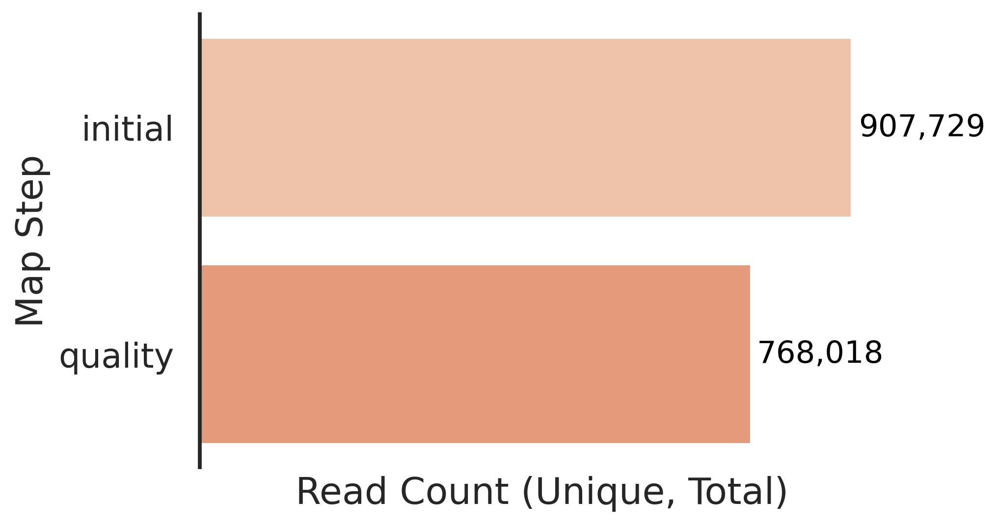

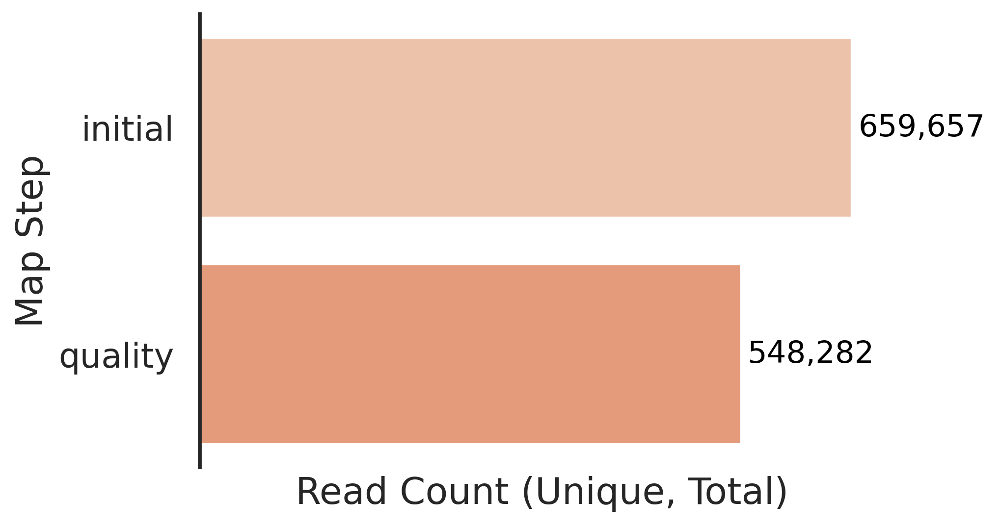

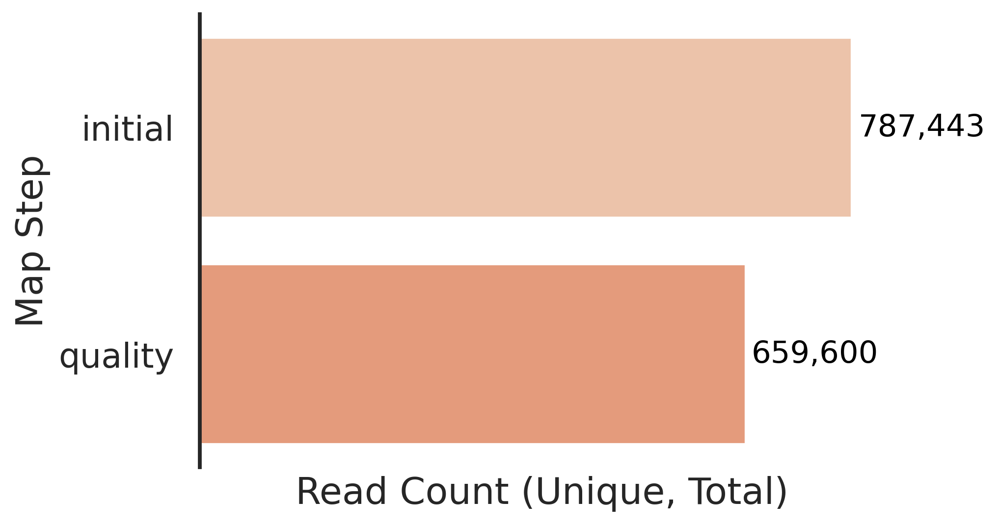

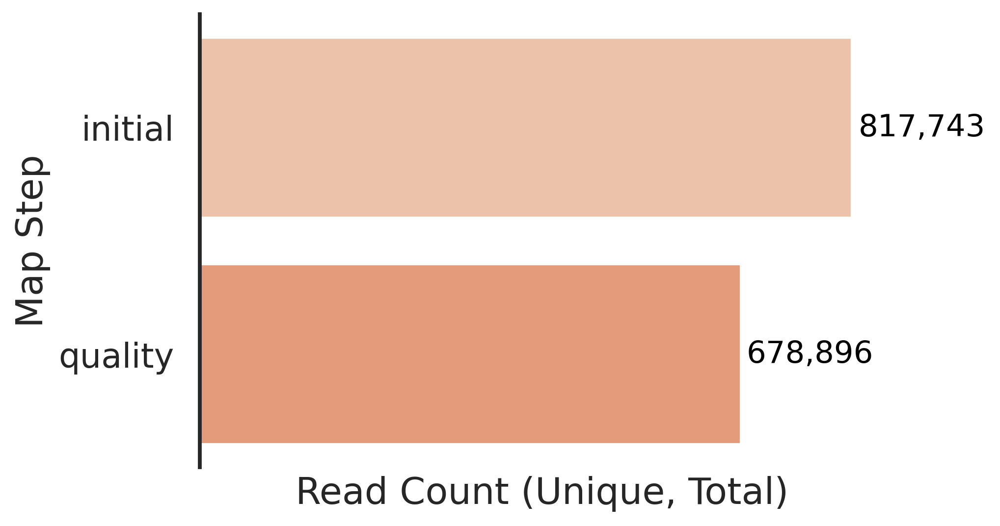

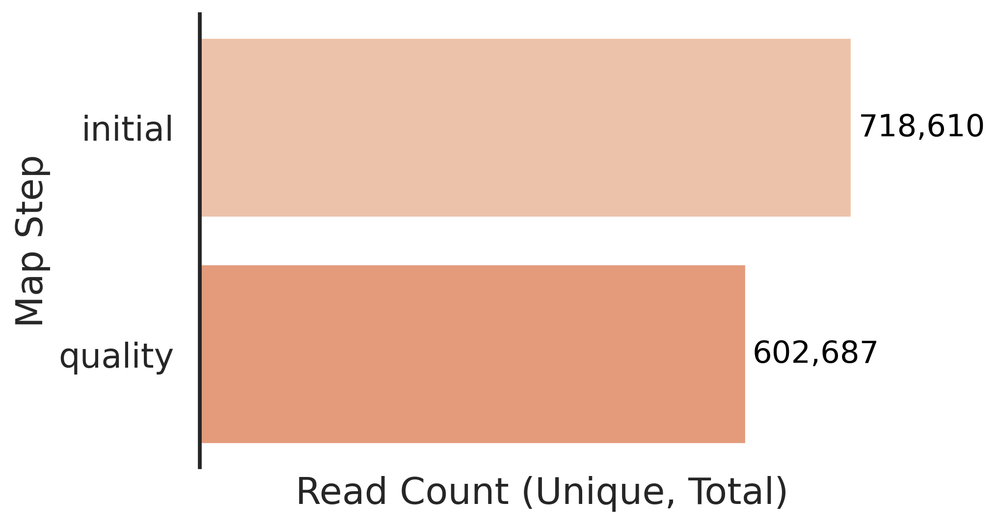

...

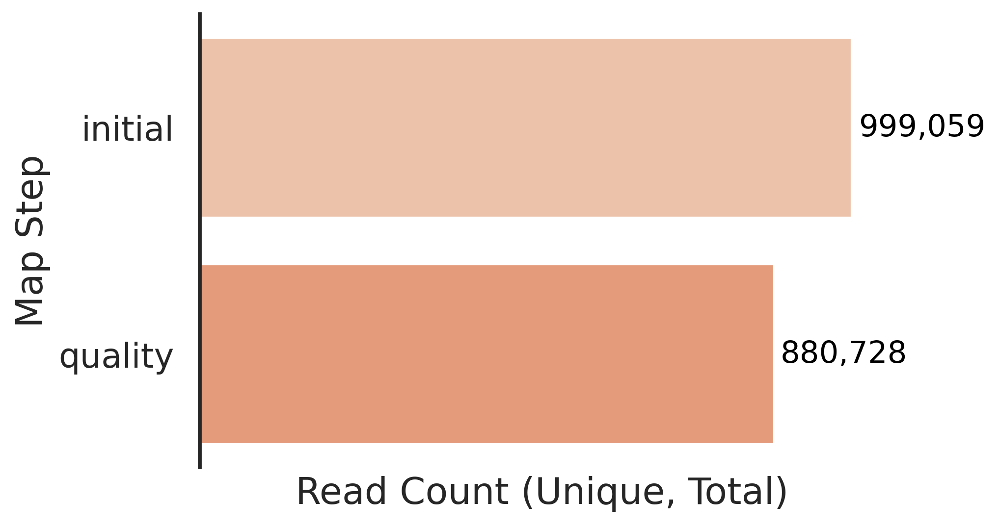

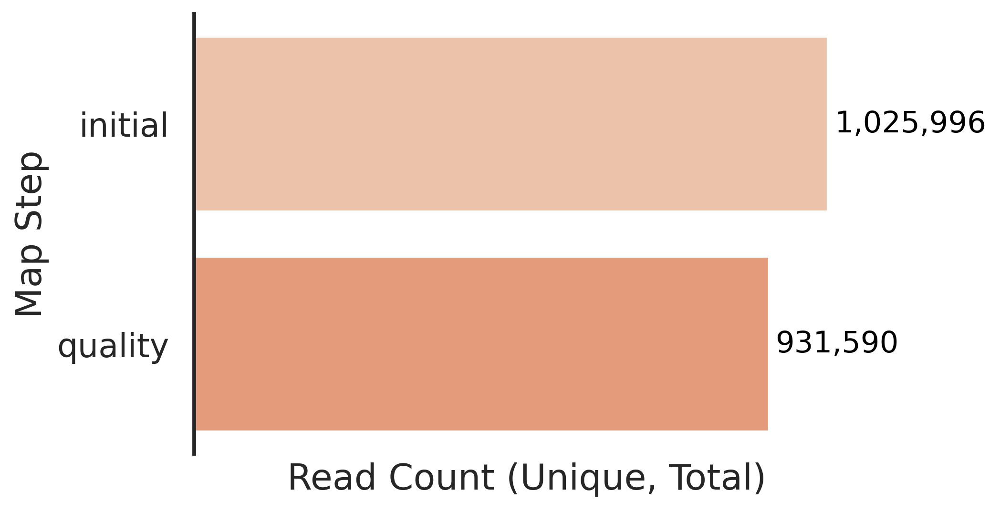

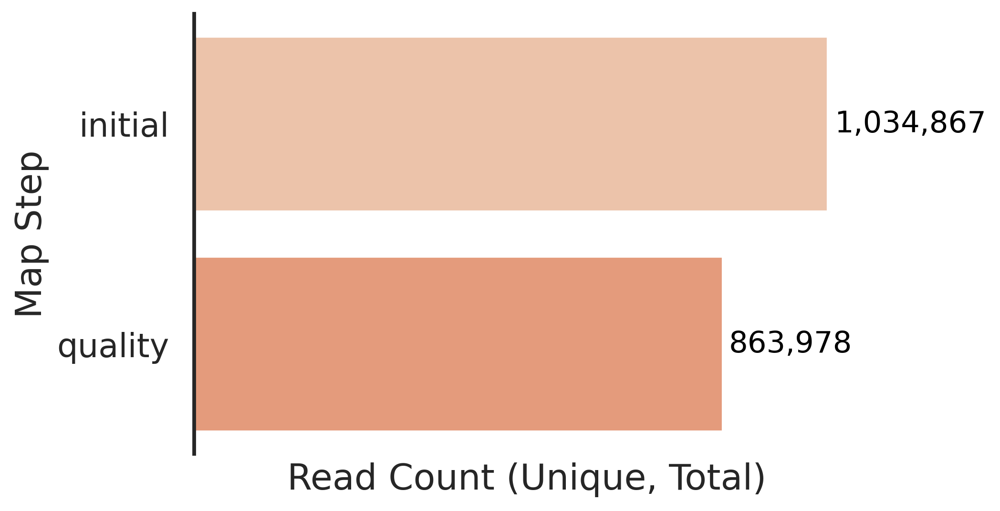

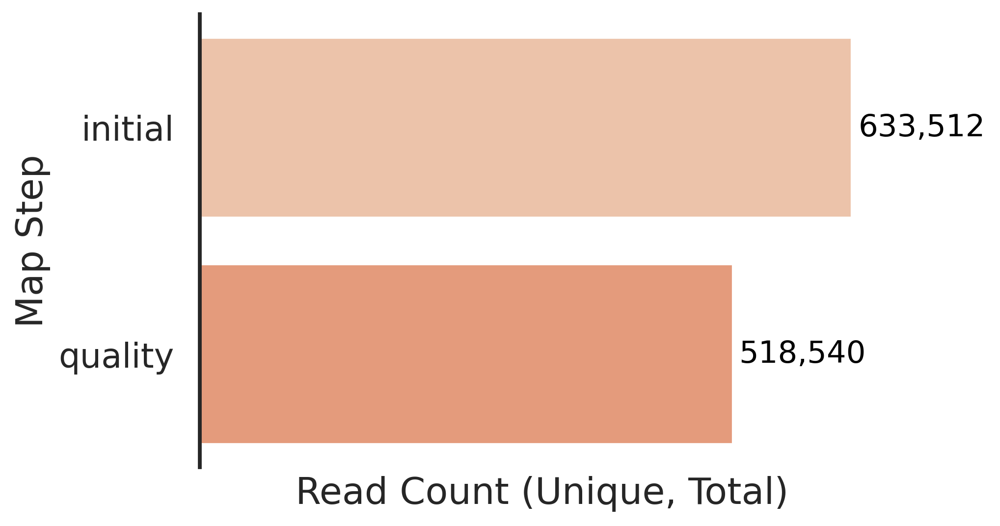

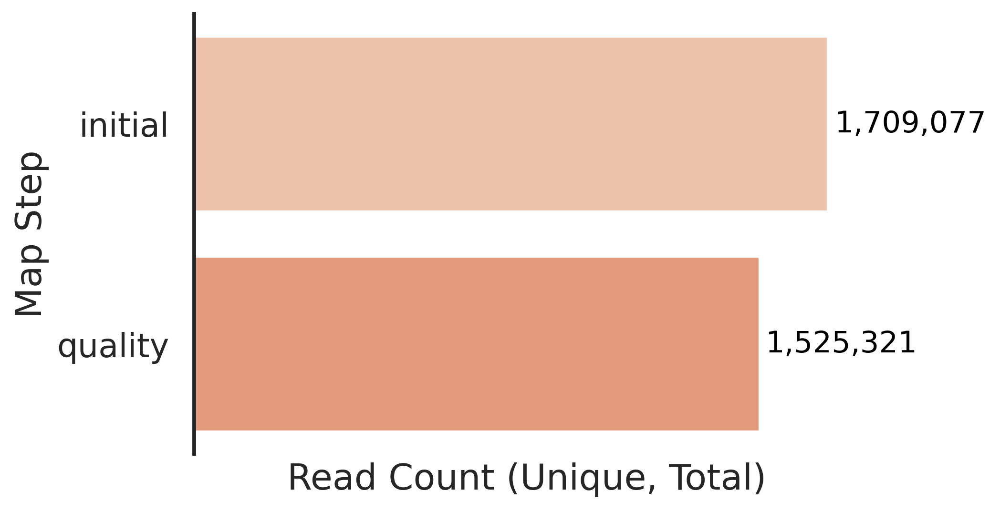

In [6]:
trebl_exp_results_no_err_corr = pipeline_no_err_corr.trebl_experiment_analysis(
        AD_seq_files = AD_seq_files,
        AD_bc_objects = [trebl_exp_ADBC2, trebl_exp_HawkBCs],
        RT_seq_files = RT_seq_files,
        RT_bc_objects = [trebl_exp_RTBC],
        reverse_complement = True,
        AD_umi_object = UMI,
        RT_umi_object = UMI,
        umi_deduplication='simple'
    )

In [26]:
trebl_exp_results_no_err_corr_AD_results = trebl_exp_results_no_err_corr["AD_results"]
trebl_exp_results_no_err_corr_AD_results

,AD_ADBC_concat,AD_umi_count_complex,name,ADBC2,HawkBCs,AD_umi_count_simple
0,TGATCCCCGTGTTGT,448,a2_RNA_ADBC_S18,TGATCC,CCGTGTTGT,449
1,TAAAGGCAACAGTGC,328,a2_RNA_ADBC_S18,TAAAGG,CAACAGTGC,329
2,ATTATCCATACGATC,2264,a2_RNA_ADBC_S18,ATTATC,CATACGATC,2278
3,GATACCACACAGTTC,836,a2_RNA_ADBC_S18,GATACC,ACACAGTTC,838
4,ATGCCAACCTGCCTA,1725,a2_RNA_ADBC_S18,ATGCCA,ACCTGCCTA,1728
...,...,...,...,...,...,...
37369,GGTTATCACAACTTG,1,a5_RNA_ADBC_S21,GGTTAT,CACAACTTG,1
37370,TCATATCATCCTGTC,1,a5_RNA_ADBC_S21,TCATAT,CATCCTGTC,1
37371,GGGAATCAGGTTCTC,1,a5_RNA_ADBC_S21,GGGAAT,CAGGTTCTC,1
37372,CTTGAACCAAGGGGT,1,a5_RNA_ADBC_S21,CTTGAA,CCAAGGGGT,1


In [25]:
trebl_exp_results_no_err_corr_RT_results = trebl_exp_results_no_err_corr["RT_results"]
trebl_exp_results_no_err_corr_RT_results

,RTBC,RTBC_umi_count_complex,name,RTBC_umi_count_simple
0,TAAAAGAGGACTGCAA,2146,r2_RNA_RTBC_S26,2156
1,ATGTTACCGGGTCGAC,445,r2_RNA_RTBC_S26,446
2,AAATGTAGGAAAGCTG,2307,r2_RNA_RTBC_S26,2320
3,CTCTCAAATAAAACAC,65,r2_RNA_RTBC_S26,65
4,GATTATTGGTGCTATG,263,r2_RNA_RTBC_S26,263
...,...,...,...,...
48144,GACCAGAACGTTCGAA,1,r4_RNA_RTBC_S28,1
48145,AAGCTACAAGTATCGG,1,r4_RNA_RTBC_S28,1
48146,CATCCACTGTTATTCG,1,r4_RNA_RTBC_S28,1
48147,ATCTTACCGGGTCGAC,1,r4_RNA_RTBC_S28,1


## Manual error correction

✓ Initial map already exists: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_initial — skipping
Base prefix (stable across descriptors): trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.83 seconds.


=== Running error correction step on trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a2_RNA_ADBC_S18 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 769918 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1170


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 0.50 seconds.

Whitelist application complete for trebl_experiment_a2_RNA_ADBC_S18 at trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_error_corrected
Done in 46.37 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_loss_summary'
Done in 0.03 seconds.

['../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt']
Saved barcode whitelist plots: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_whitelist_summary.png


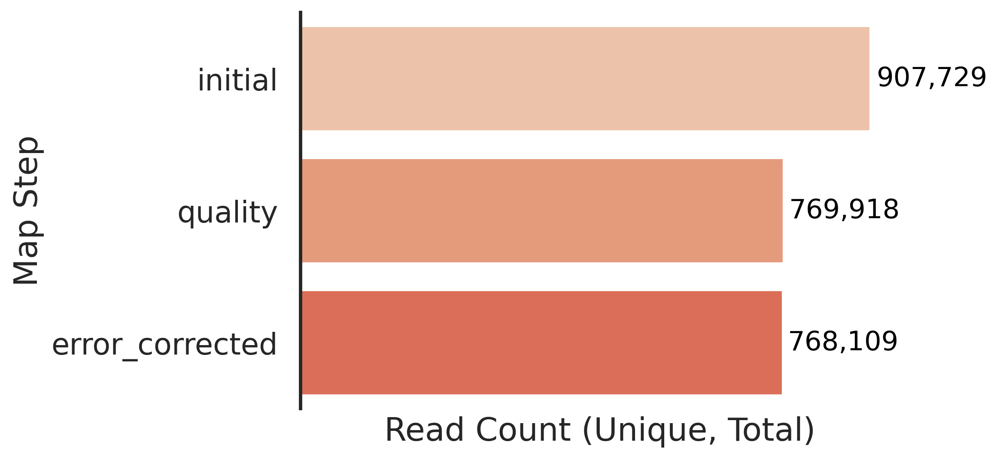

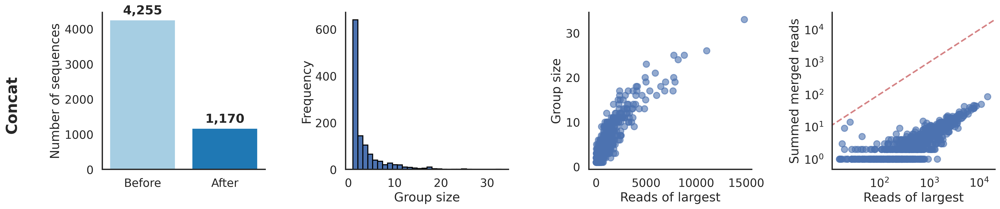

Done in 7.72 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq (768109 reads)...


Writing FASTQ: 100%|██████████| 768109/768109 [00:01<00:00, 729022.73it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq
Done in 2.29 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.2.bt2
Renaming 

Done in 3.24 seconds.

Aligning .FASTQ to reference .FA ...


768109 reads; of these:
  768109 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    768109 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_deduplicated.bam
# job started at Fri Jan 16 12:25:45 2026 on n0120.savio2 -- f9c03616-fa7a-4039-9015-39e87d59ada8
# pid: 120603, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1219
Done in 0.55 seconds.

Whitelist application complete for trebl_experiment_a7_RNA_ADBC_S23 at trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_error_corrected
Done in 33.81 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBC

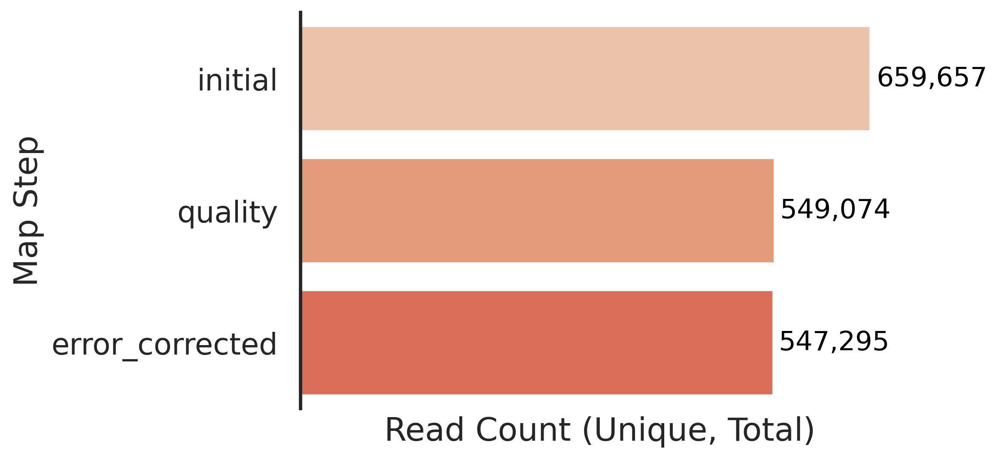

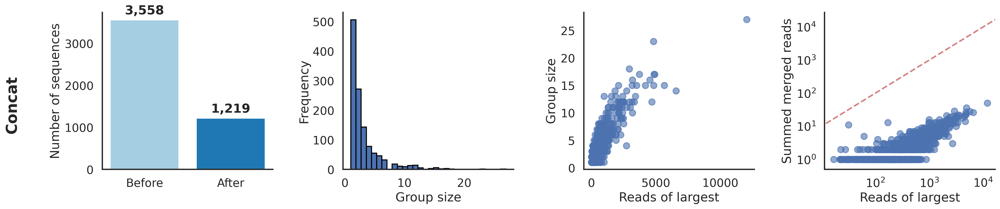

Done in 7.50 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq (547295 reads)...


Writing FASTQ: 100%|██████████| 547295/547295 [00:00<00:00, 708648.74it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq
Done in 1.66 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.2.bt2
Renaming 

Done in 2.77 seconds.

Aligning .FASTQ to reference .FA ...


547295 reads; of these:
  547295 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    547295 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_deduplicated.bam
# job started at Fri Jan 16 12:28:56 2026 on n0120.savio2 -- c15c11d5-d65e-4c51-a6ab-fe079a267912
# pid: 120868, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1156
Done in 0.52 seconds.

Whitelist application complete for trebl_experiment_a1_RNA_ADBC_S17 at trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_error_corrected
Done in 37.41 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBC

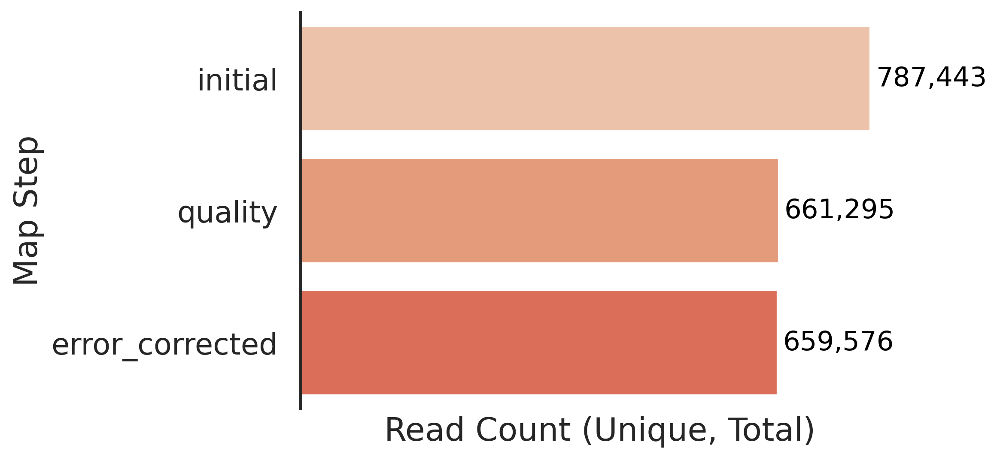

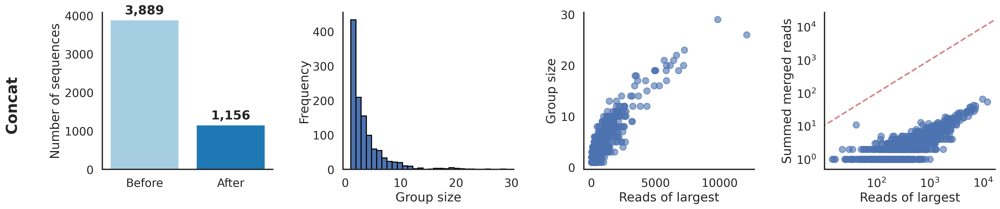

Done in 7.64 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.fastq (659576 reads)...


Writing FASTQ: 100%|██████████| 659576/659576 [00:00<00:00, 718197.86it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.fastq
Done in 1.98 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_barcodes_index.2.bt2
Renaming 

Done in 2.90 seconds.

Aligning .FASTQ to reference .FA ...


659576 reads; of these:
  659576 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    659576 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a1_RNA_ADBC_S17/a1_RNA_ADBC_S17_umi_deduplicated.bam
# job started at Fri Jan 16 12:31:16 2026 on n0120.savio2 -- be8bffa5-a06a-451e-99e8-18cb8dcfa984
# pid: 121117, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.22 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.52 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 2.51 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.89 seconds.



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 2.54 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.89 seconds.


=== Running error correction step on trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a3_RNA_ADBC_S19 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 679747 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1235
Done in 0.83 seconds.

Whitelist application complete for trebl_experiment_a3_RNA_ADBC_S19 at trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_error_corrected
Done in 39.12 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBC

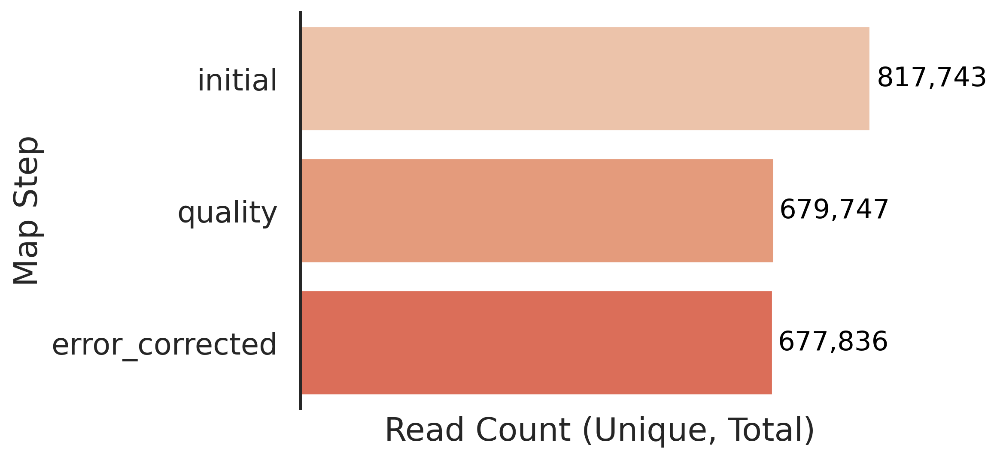

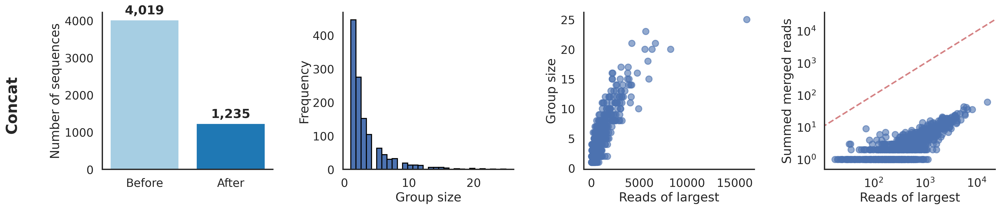

Done in 7.72 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.fastq (677836 reads)...


Writing FASTQ: 100%|██████████| 677836/677836 [00:00<00:00, 722272.52it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.fastq
Done in 2.03 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_barcodes_index.2.bt2
Renaming 

Done in 2.91 seconds.

Aligning .FASTQ to reference .FA ...


677836 reads; of these:
  677836 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    677836 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a3_RNA_ADBC_S19/a3_RNA_ADBC_S19_umi_deduplicated.bam
# job started at Fri Jan 16 12:34:21 2026 on n0120.savio2 -- 047e23b9-3c61-4ad7-980e-8def58d0ed3d
# pid: 121415, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.49 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.20 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 3.74 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.82 seconds.

Done in 2.08 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.67 seconds.


=== Running error correction step on trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a6_RNA_ADBC_S22 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/trebl_experiment

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1144
Done in 0.93 seconds.

Whitelist application complete for trebl_experiment_a6_RNA_ADBC_S22 at trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_error_corrected
Done in 36.66 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBC

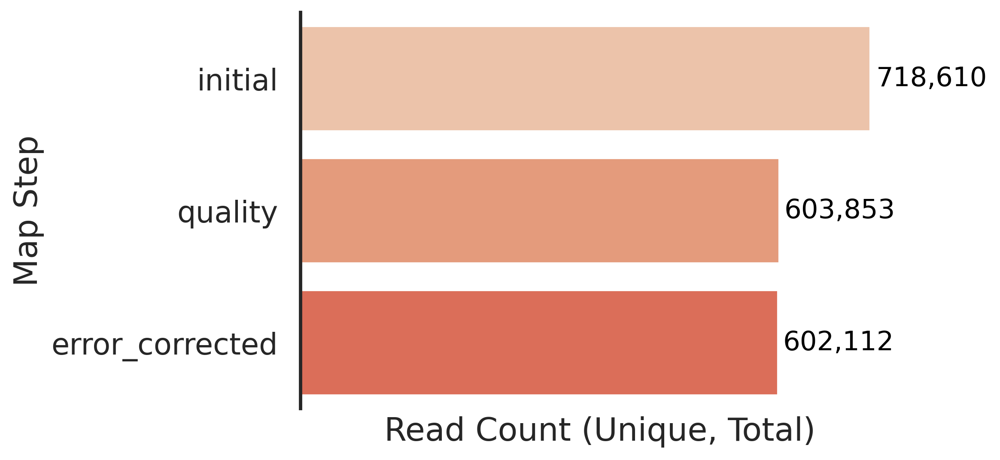

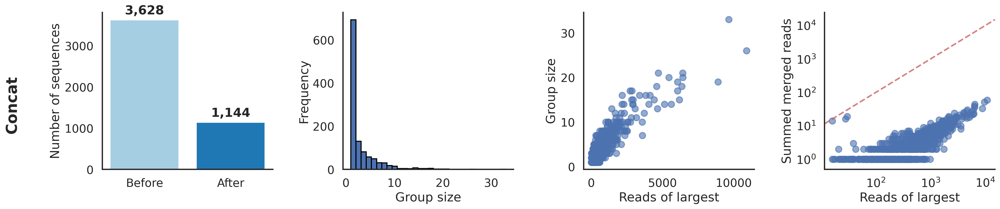

Done in 7.67 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.fastq (602112 reads)...


Writing FASTQ: 100%|██████████| 602112/602112 [00:00<00:00, 730118.80it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.fastq
Done in 1.80 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_barcodes_index.2.bt2
Renaming 

Done in 2.88 seconds.

Aligning .FASTQ to reference .FA ...


602112 reads; of these:
  602112 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    602112 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a6_RNA_ADBC_S22/a6_RNA_ADBC_S22_umi_deduplicated.bam
# job started at Fri Jan 16 12:37:17 2026 on n0120.savio2 -- f5baadb9-d707-496f-9c02-05ee6da86c2e
# pid: 121706, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.35 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.27 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 2.55 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.87 seconds.

Done in 2.24 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.74 seconds.


=== Running error correction step on trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a4_RNA_ADBC_S20 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/trebl_experiment

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1226
Done in 0.71 seconds.

Whitelist application complete for trebl_experiment_a4_RNA_ADBC_S20 at trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_error_corrected
Done in 36.61 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBC

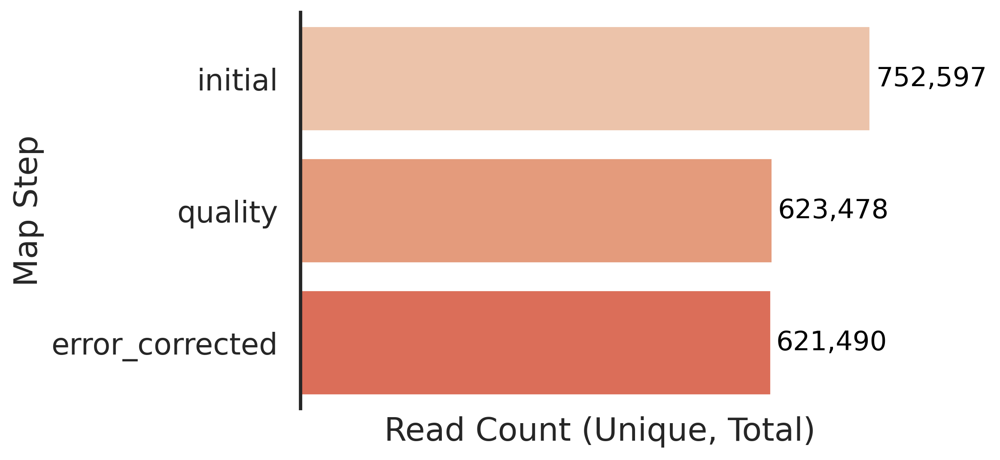

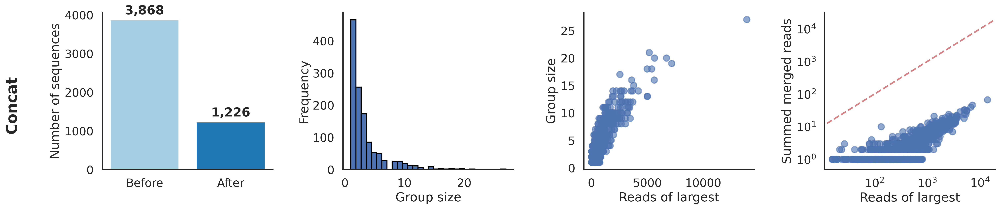

Done in 7.63 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.fastq (621490 reads)...


Writing FASTQ: 100%|██████████| 621490/621490 [00:00<00:00, 722247.80it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.fastq
Done in 2.84 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_barcodes_index.2.bt2
Renaming 

Done in 2.89 seconds.

Aligning .FASTQ to reference .FA ...


621490 reads; of these:
  621490 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    621490 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a4_RNA_ADBC_S20/a4_RNA_ADBC_S20_umi_deduplicated.bam
# job started at Fri Jan 16 12:40:01 2026 on n0120.savio2 -- 6554138a-98f1-4f41-81bf-5d6751fa3cc7
# pid: 121960, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.88 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.60 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 2.65 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.90 seconds.



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 2.56 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.93 seconds.


=== Running error correction step on trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a8_RNA_ADBC_S24 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 679909 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1237
Done in 0.88 seconds.

Whitelist application complete for trebl_experiment_a8_RNA_ADBC_S24 at trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_error_corrected
Done in 40.22 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBC

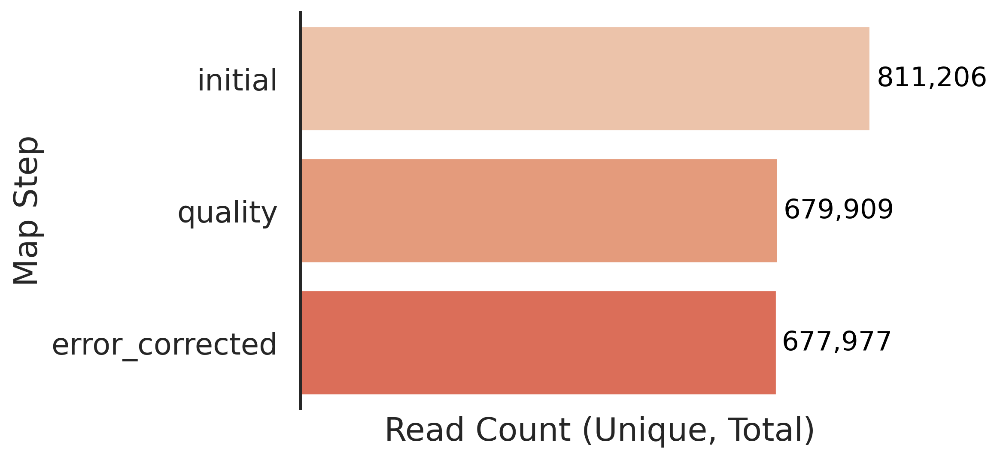

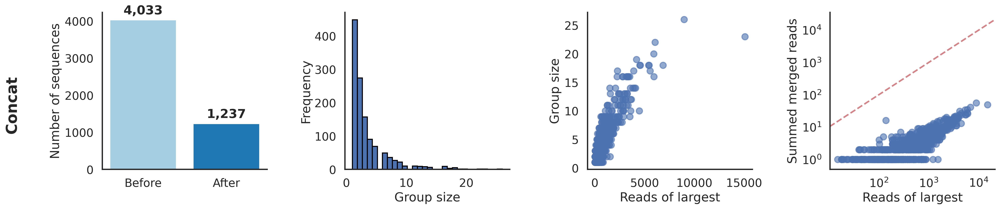

Done in 7.75 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.fastq (677977 reads)...


Writing FASTQ: 100%|██████████| 677977/677977 [00:00<00:00, 724009.74it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.fastq
Done in 2.02 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_barcodes_index.2.bt2
Renaming 

Done in 2.59 seconds.

Aligning .FASTQ to reference .FA ...


677977 reads; of these:
  677977 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    677977 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a8_RNA_ADBC_S24/a8_RNA_ADBC_S24_umi_deduplicated.bam
# job started at Fri Jan 16 12:42:44 2026 on n0120.savio2 -- a6ccf066-3c6d-4e03-8654-06a32e90d912
# pid: 122229, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.95 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.27 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 4.04 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.92 seconds.



FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 2.65 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.96 seconds.


=== Running error correction step on trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a5_RNA_ADBC_S21 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 703190 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1142
Done in 0.95 seconds.

Whitelist application complete for trebl_experiment_a5_RNA_ADBC_S21 at trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_error_corrected
Done in 41.46 seconds.

Done.
Saved loss summary table as 'trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBC

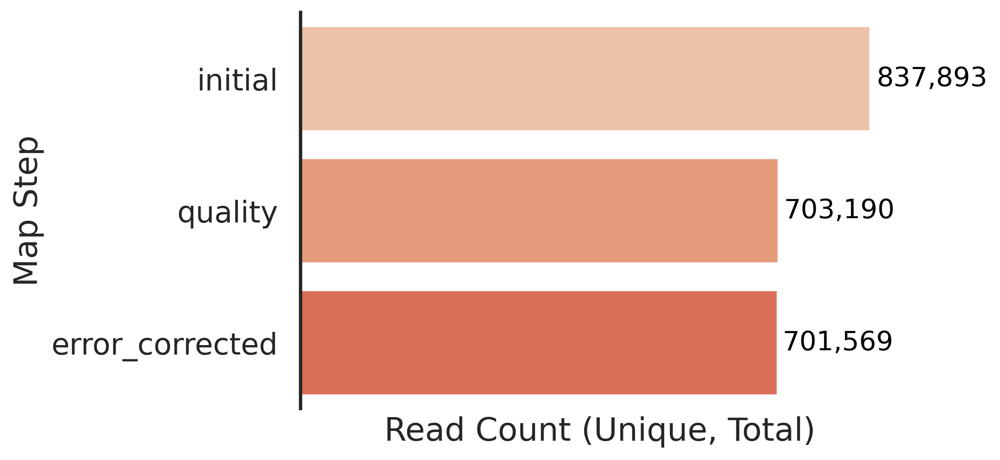

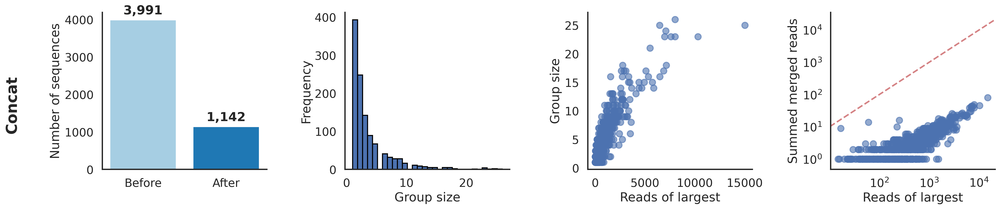

Done in 7.69 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.fastq (701569 reads)...


Writing FASTQ: 100%|██████████| 701569/701569 [00:00<00:00, 717728.53it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.fastq
Done in 2.13 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_barcodes_index.2.bt2
Renaming 

Done in 2.69 seconds.

Aligning .FASTQ to reference .FA ...


701569 reads; of these:
  701569 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    701569 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_a5_RNA_ADBC_S21/a5_RNA_ADBC_S21_umi_deduplicated.bam
# job started at Fri Jan 16 12:45:44 2026 on n0120.savio2 -- f2205a89-f432-46fb-8127-52e5bc53a1a3
# pid: 122483, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.63 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.60 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.52 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 1.40 seconds.

Done in 1.95 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r2_RNA_RTBC_S26_RTBC_
Full prefix for this instance: trebl_experiment_r2_RNA_RTBC_S26_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_r2_RNA_RTBC_S26_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 1.80 seconds.


=== Running error correction step on trebl_experiment_r2_RNA_RTBC_S26_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r2_RNA_RTBC_S26 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/trebl_experiment_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted.fastq
Wrote 871037 reads to /g

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/trebl_experiment_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/trebl_experiment_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/trebl_experiment_r2_RNA_RTBC_S26_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1078
Done in 1.06 seconds.

Whitelist application complete for trebl_experiment_r2_RNA_RTBC_S26 at trebl_experiment_r2_RNA_RTBC_S26_RTBC_error_corrected
Done in 43.38 seconds.

Done.
Saved loss summary table as 'trebl_experiment_r2_RNA_RTBC_S26_RTBC_loss_summary'
Done in 0.03 seconds.

['../.

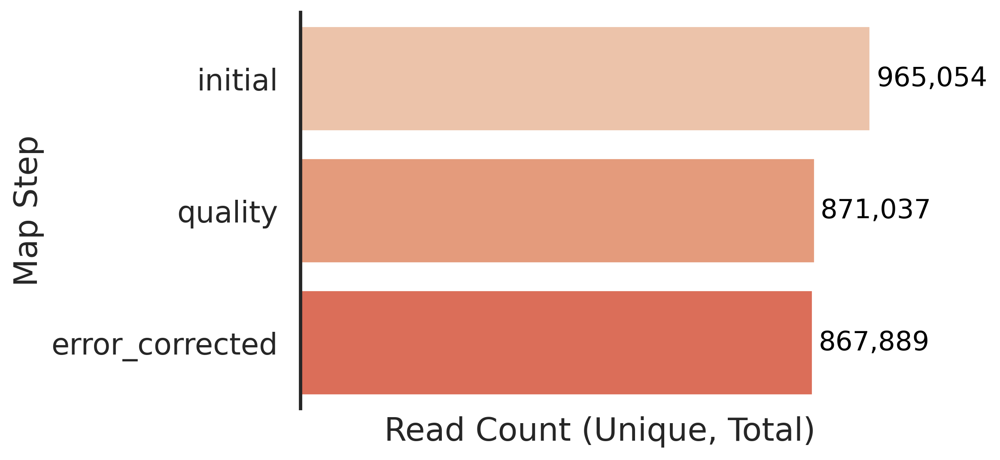

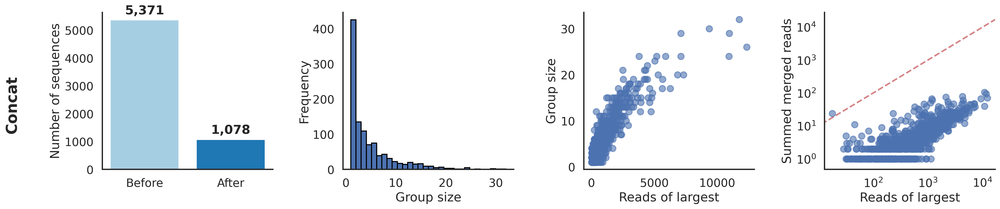

Done in 7.69 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.fastq (867889 reads)...


Writing FASTQ: 100%|██████████| 867889/867889 [00:01<00:00, 720268.52it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.fastq
Done in 2.56 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r2_RNA_RTBC_S26_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_barcodes_index.2.bt2
Renaming 

Done in 2.97 seconds.

Aligning .FASTQ to reference .FA ...


867889 reads; of these:
  867889 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    867889 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r2_RNA_RTBC_S26/r2_RNA_RTBC_S26_umi_deduplicated.bam
# job started at Fri Jan 16 12:48:57 2026 on n0120.savio2 -- 1551cbcd-bb55-4d51-aac1-38f11b37c04b
# pid: 122736, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.72 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 6.72 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.43 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 1.38 seconds.

Done in 1.53 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r8_RNA_RTBC_S32_RTBC_
Full prefix for this instance: trebl_experiment_r8_RNA_RTBC_S32_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_r8_RNA_RTBC_S32_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 1.85 seconds.


=== Running error correction step on trebl_experiment_r8_RNA_RTBC_S32_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r8_RNA_RTBC_S32 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/trebl_experiment_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted.fastq
Wrote 873189 reads to /g

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/trebl_experiment_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/trebl_experiment_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/trebl_experiment_r8_RNA_RTBC_S32_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1162
Done in 0.70 seconds.

Whitelist application complete for trebl_experiment_r8_RNA_RTBC_S32 at trebl_experiment_r8_RNA_RTBC_S32_RTBC_error_corrected
Done in 44.26 seconds.

Done.
Saved loss summary table as 'trebl_experiment_r8_RNA_RTBC_S32_RTBC_loss_summary'
Done in 0.03 seconds.

['../.

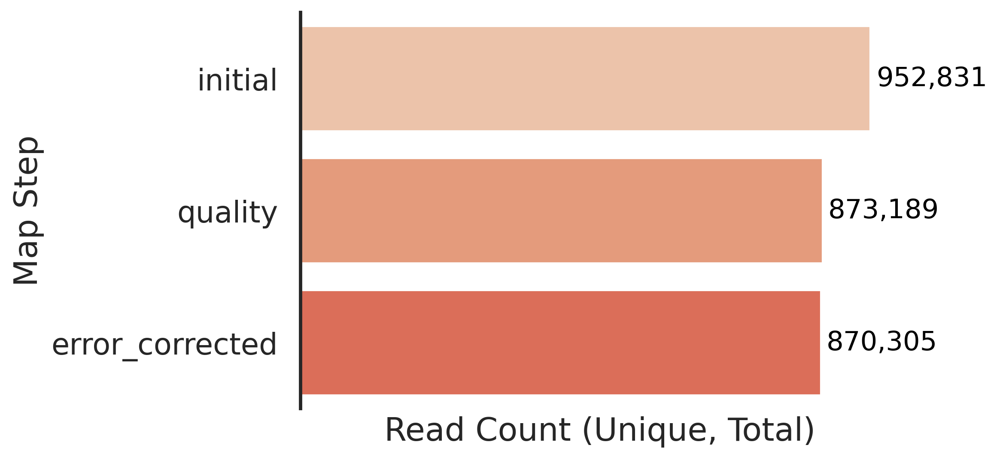

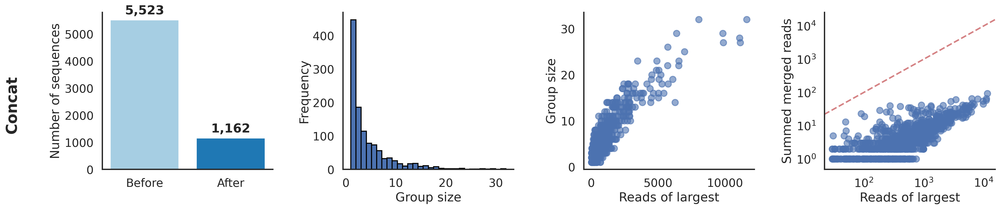

Done in 7.64 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.fastq (870305 reads)...


Writing FASTQ: 100%|██████████| 870305/870305 [00:01<00:00, 726310.16it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.fastq
Done in 2.55 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r8_RNA_RTBC_S32_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_barcodes_index.2.bt2
Renaming 

Done in 2.80 seconds.

Aligning .FASTQ to reference .FA ...


870305 reads; of these:
  870305 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    870305 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r8_RNA_RTBC_S32/r8_RNA_RTBC_S32_umi_deduplicated.bam
# job started at Fri Jan 16 12:52:51 2026 on n0120.savio2 -- db1ffd73-45d9-4851-a925-ea51d7a8d73e
# pid: 122982, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.25 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.70 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.34 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.90 seconds.

Done in 1.90 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r7_RNA_RTBC_S31_RTBC_
Full prefix for this instance: trebl_experiment_r7_RNA_RTBC_S31_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_r7_RNA_RTBC_S31_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 1.36 seconds.


=== Running error correction step on trebl_experiment_r7_RNA_RTBC_S31_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r7_RNA_RTBC_S31 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/trebl_experiment_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted.fastq
Wrote 597182 reads to /g

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/trebl_experiment_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/trebl_experiment_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/trebl_experiment_r7_RNA_RTBC_S31_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1066
Done in 0.86 seconds.

Whitelist application complete for trebl_experiment_r7_RNA_RTBC_S31 at trebl_experiment_r7_RNA_RTBC_S31_RTBC_error_corrected
Done in 36.04 seconds.

Done.
Saved loss summary table as 'trebl_experiment_r7_RNA_RTBC_S31_RTBC_loss_summary'
Done in 0.03 seconds.

['../.

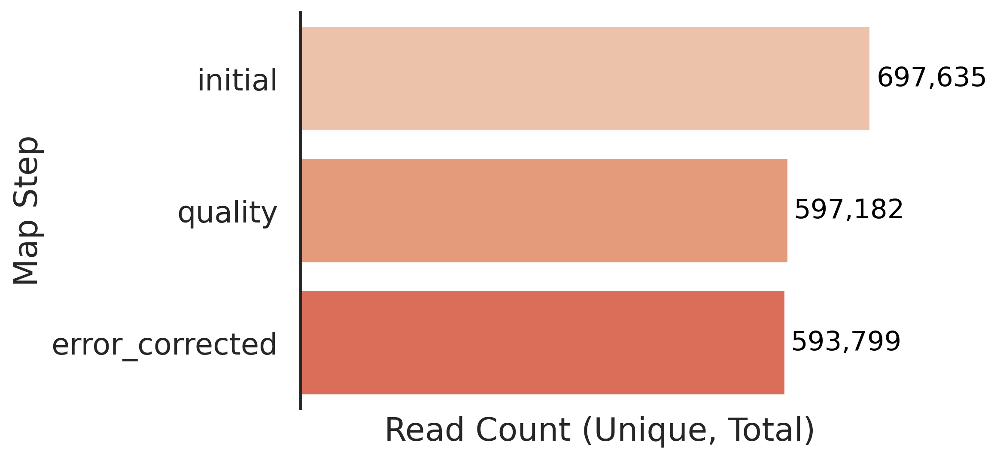

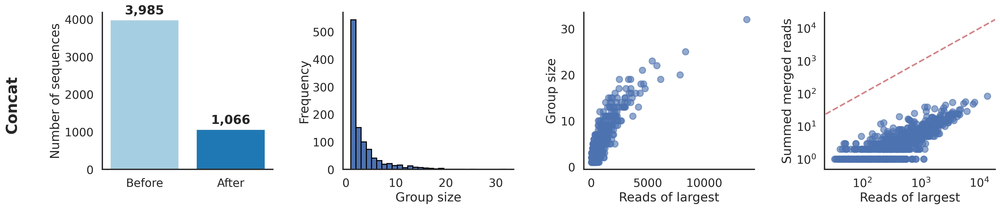

Done in 7.56 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.fastq (593799 reads)...


Writing FASTQ: 100%|██████████| 593799/593799 [00:00<00:00, 699956.75it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.fastq
Done in 1.76 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r7_RNA_RTBC_S31_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_barcodes_index.2.bt2
Renaming 

Done in 2.84 seconds.

Aligning .FASTQ to reference .FA ...


593799 reads; of these:
  593799 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    593799 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r7_RNA_RTBC_S31/r7_RNA_RTBC_S31_umi_deduplicated.bam
# job started at Fri Jan 16 12:56:10 2026 on n0120.savio2 -- f362fda3-f433-407b-bb16-3901ef6d6a49
# pid: 123216, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.38 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.20 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.42 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 1.45 seconds.

Done in 1.23 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r1_RNA_RTBC_S25_RTBC_
Full prefix for this instance: trebl_experiment_r1_RNA_RTBC_S25_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_r1_RNA_RTBC_S25_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 1.83 seconds.


=== Running error correction step on trebl_experiment_r1_RNA_RTBC_S25_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r1_RNA_RTBC_S25 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/trebl_experiment_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted.fastq
Wrote 890359 reads to /g

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/trebl_experiment_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/trebl_experiment_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/trebl_experiment_r1_RNA_RTBC_S25_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1062
Done in 0.76 seconds.

Whitelist application complete for trebl_experiment_r1_RNA_RTBC_S25 at trebl_experiment_r1_RNA_RTBC_S25_RTBC_error_corrected
Done in 43.86 seconds.

Done.
Saved loss summary table as 'trebl_experiment_r1_RNA_RTBC_S25_RTBC_loss_summary'
Done in 0.03 seconds.

['../.

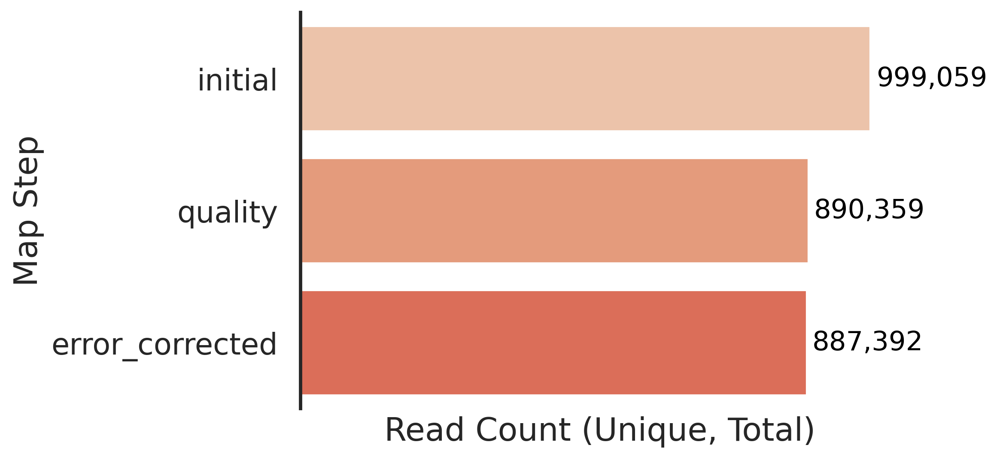

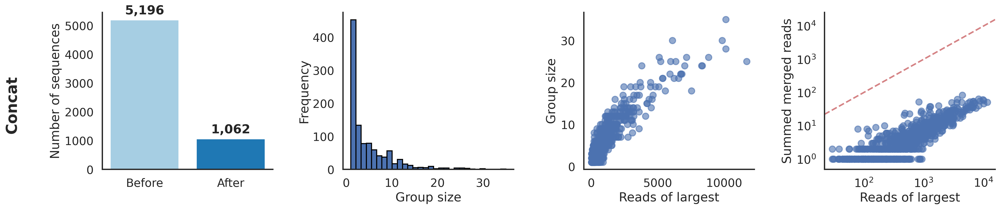

Done in 7.77 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.fastq (887392 reads)...


Writing FASTQ: 100%|██████████| 887392/887392 [00:01<00:00, 723205.13it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.fastq
Done in 2.62 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r1_RNA_RTBC_S25_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_barcodes_index.2.bt2
Renaming 

Done in 3.32 seconds.

Aligning .FASTQ to reference .FA ...


887392 reads; of these:
  887392 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    887392 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r1_RNA_RTBC_S25/r1_RNA_RTBC_S25_umi_deduplicated.bam
# job started at Fri Jan 16 12:58:42 2026 on n0120.savio2 -- e234346d-b192-43d4-9073-c0bd0b463865
# pid: 123444, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.80 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.59 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.47 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 1.48 seconds.

Done in 1.82 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r6_RNA_RTBC_S30_RTBC_
Full prefix for this instance: trebl_experiment_r6_RNA_RTBC_S30_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_r6_RNA_RTBC_S30_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 1.95 seconds.


=== Running error correction step on trebl_experiment_r6_RNA_RTBC_S30_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r6_RNA_RTBC_S30 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/trebl_experiment_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted.fastq
Wrote 943677 reads to /g

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/trebl_experiment_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/trebl_experiment_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/trebl_experiment_r6_RNA_RTBC_S30_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1096
Done in 0.82 seconds.

Whitelist application complete for trebl_experiment_r6_RNA_RTBC_S30 at trebl_experiment_r6_RNA_RTBC_S30_RTBC_error_corrected
Done in 47.06 seconds.

Done.
Saved loss summary table as 'trebl_experiment_r6_RNA_RTBC_S30_RTBC_loss_summary'
Done in 0.03 seconds.

['../.

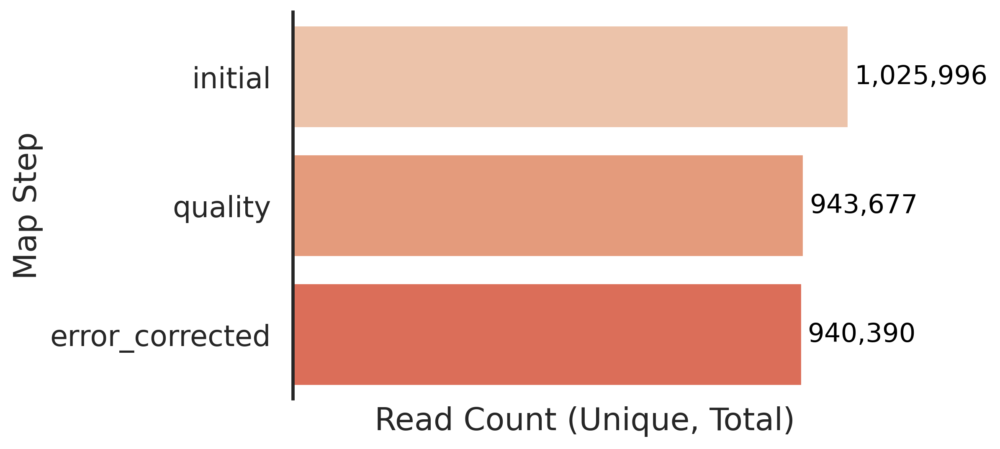

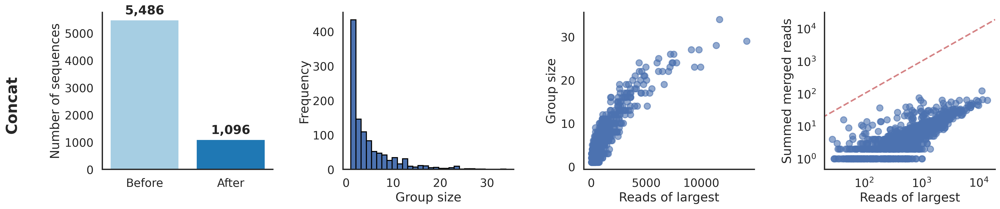

Done in 8.61 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.fastq (940390 reads)...


Writing FASTQ: 100%|██████████| 940390/940390 [00:01<00:00, 705640.04it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.fastq
Done in 2.77 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r6_RNA_RTBC_S30_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_barcodes_index.2.bt2
Renaming 

Done in 2.87 seconds.

Aligning .FASTQ to reference .FA ...


940390 reads; of these:
  940390 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    940390 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r6_RNA_RTBC_S30/r6_RNA_RTBC_S30_umi_deduplicated.bam
# job started at Fri Jan 16 13:02:16 2026 on n0120.savio2 -- c0b87fd2-7500-4146-8364-5897e5f0aeba
# pid: 123699, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.73 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 5.27 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.45 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 1.52 seconds.

Done in 1.81 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r3_RNA_RTBC_S27_RTBC_
Full prefix for this instance: trebl_experiment_r3_RNA_RTBC_S27_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_r3_RNA_RTBC_S27_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 1.92 seconds.


=== Running error correction step on trebl_experiment_r3_RNA_RTBC_S27_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r3_RNA_RTBC_S27 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/trebl_experiment_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted.fastq
Wrote 887050 reads to /g

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/trebl_experiment_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/trebl_experiment_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/trebl_experiment_r3_RNA_RTBC_S27_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1145
Done in 0.77 seconds.

Whitelist application complete for trebl_experiment_r3_RNA_RTBC_S27 at trebl_experiment_r3_RNA_RTBC_S27_RTBC_error_corrected
Done in 44.29 seconds.

Done.
Saved loss summary table as 'trebl_experiment_r3_RNA_RTBC_S27_RTBC_loss_summary'
Done in 0.03 seconds.

['../.

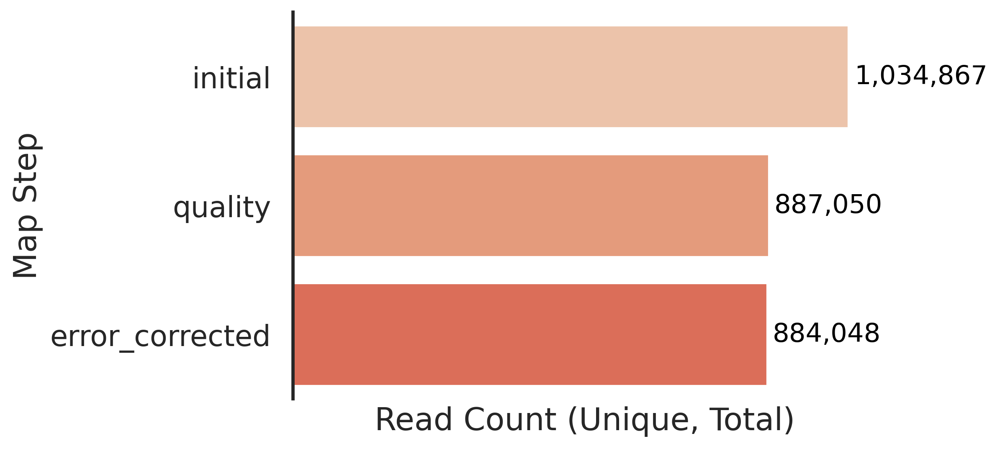

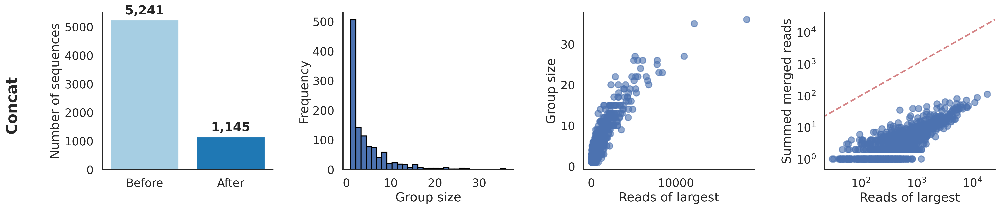

Done in 7.71 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.fastq (884048 reads)...


Writing FASTQ: 100%|██████████| 884048/884048 [00:01<00:00, 710424.07it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.fastq
Done in 2.63 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r3_RNA_RTBC_S27_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_barcodes_index.2.bt2
Renaming 

Done in 2.64 seconds.

Aligning .FASTQ to reference .FA ...


884048 reads; of these:
  884048 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    884048 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r3_RNA_RTBC_S27/r3_RNA_RTBC_S27_umi_deduplicated.bam
# job started at Fri Jan 16 13:05:52 2026 on n0120.savio2 -- 7f4275ae-7e77-46ca-b8dc-e6e210e47509
# pid: 123941, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 3.72 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.19 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.55 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.89 seconds.

Done in 1.70 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r5_RNA_RTBC_S29_RTBC_
Full prefix for this instance: trebl_experiment_r5_RNA_RTBC_S29_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_r5_RNA_RTBC_S29_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 1.34 seconds.


=== Running error correction step on trebl_experiment_r5_RNA_RTBC_S29_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r5_RNA_RTBC_S29 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/trebl_experiment_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted.fastq
Wrote 523099 reads to /g

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/trebl_experiment_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/trebl_experiment_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/trebl_experiment_r5_RNA_RTBC_S29_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 982
Done in 0.76 seconds.

Whitelist application complete for trebl_experiment_r5_RNA_RTBC_S29 at trebl_experiment_r5_RNA_RTBC_S29_RTBC_error_corrected
Done in 32.24 seconds.

Done.
Saved loss summary table as 'trebl_experiment_r5_RNA_RTBC_S29_RTBC_loss_summary'
Done in 0.03 seconds.

['../..

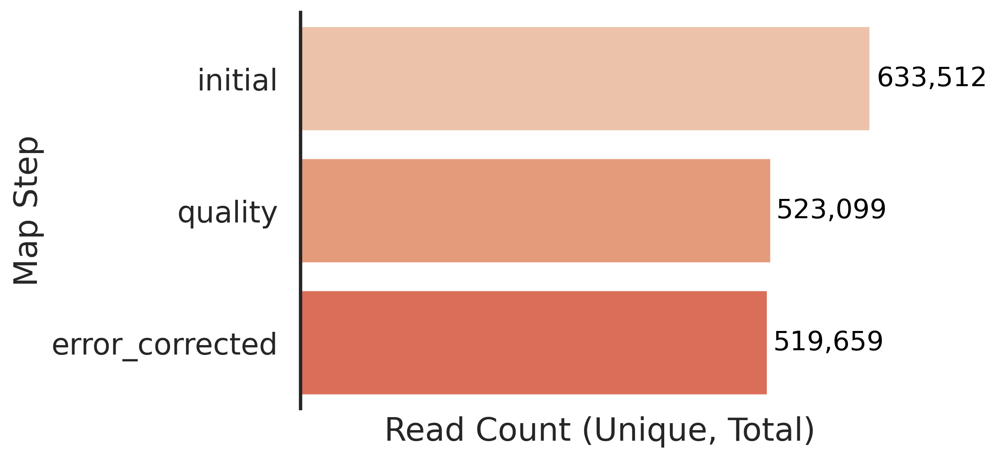

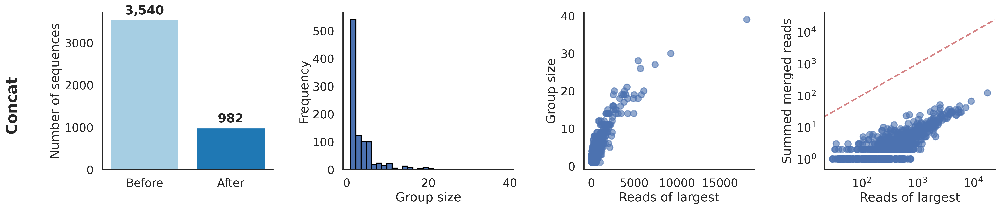

Done in 7.60 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.fastq (519659 reads)...


Writing FASTQ: 100%|██████████| 519659/519659 [00:00<00:00, 705304.85it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.fastq
Done in 1.50 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r5_RNA_RTBC_S29_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_barcodes_index.2.bt2
Renaming 

Done in 2.95 seconds.

Aligning .FASTQ to reference .FA ...


519659 reads; of these:
  519659 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    519659 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r5_RNA_RTBC_S29/r5_RNA_RTBC_S29_umi_deduplicated.bam
# job started at Fri Jan 16 13:08:45 2026 on n0120.savio2 -- 1b102a50-9ca1-44e9-8ba6-e38af400ac14
# pid: 124172, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 10.92 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 10.38 seconds.

Extracting 1 barcodes...
Regex for RTBC: GCCCC(.*)GCGG
Done in 1.76 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 1.45 seconds.

Done in 2.06 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_r4_RNA_RTBC_S28_RTBC_
Full prefix for this instance: trebl_experiment_r4_RNA_RTBC_S28_RTBC_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Created table: trebl_experiment_r4_RNA_RTBC_S28_RTBC_quality — filtered for TRUE in all *_qual columns.
Done in 3.05 seconds.


=== Running error correction step on trebl_experiment_r4_RNA_RTBC_S28_RTBC_quality ===

=== Applying whitelist for trebl_experiment_r4_RNA_RTBC_S28 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/trebl_experiment_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted.fastq
Wrote 1549966 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/trebl_experiment_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted.fastq
Done in 2.14 seconds.

Inferring expected barcode count from grouped reads...
Using reads threshold of 30
Inferred expected barcode count: 1229
Running umi_tools whitelist...
Using custom cell number.
Running umi_tools whitelist on trebl_experiment_r4_RNA_RTBC_S28_RTBC_f

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/trebl_experiment_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/trebl_experiment_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/trebl_experiment_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 1229


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 0.84 seconds.

Whitelist application complete for trebl_experiment_r4_RNA_RTBC_S28 at trebl_experiment_r4_RNA_RTBC_S28_RTBC_error_corrected
Done in 1.09 minutes.

Done.
Saved loss summary table as 'trebl_experiment_r4_RNA_RTBC_S28_RTBC_loss_summary'
Done in 0.03 seconds.

['../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/trebl_experiment_r4_RNA_RTBC_S28_RTBC_filtered_barcodes_extracted_whitelist.txt']
Saved barcode whitelist plots: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/trebl_experiment_r4_RNA_RTBC_S28_RTBC_whitelist_summary.png


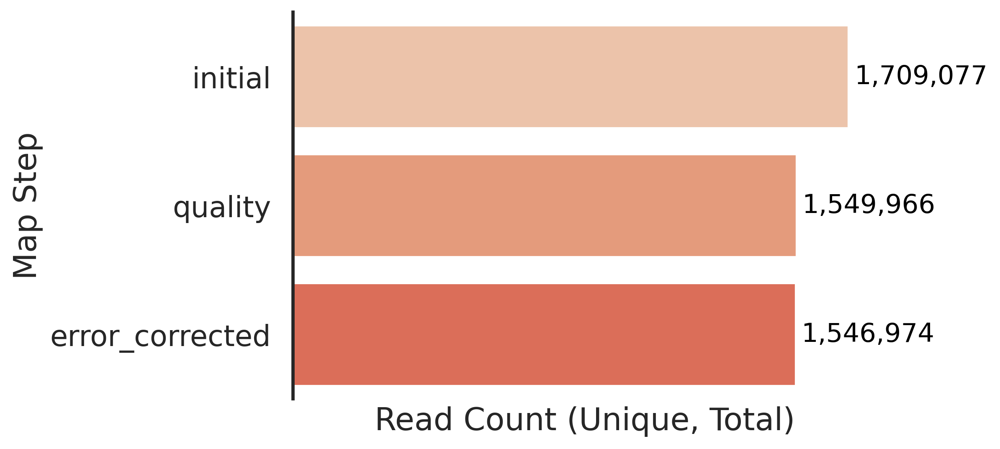

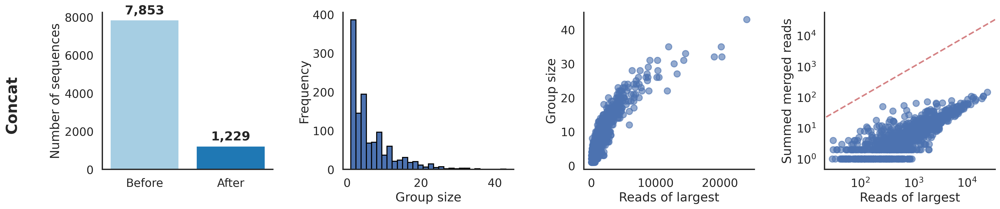

Done in 7.75 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Writing FASTQ to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.fastq (1546974 reads)...


Writing FASTQ: 100%|██████████| 1546974/1546974 [00:02<00:00, 721487.58it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.fastq
Done in 4.54 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_r4_RNA_RTBC_S28_RTBC_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_barcodes_index.2.bt2
Renaming 

Done in 2.96 seconds.

Aligning .FASTQ to reference .FA ...


1546974 reads; of these:
  1546974 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    1546974 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/err_corr/trebl_experiment_r4_RNA_RTBC_S28/r4_RNA_RTBC_S28_umi_deduplicated.bam
# job started at Fri Jan 16 13:11:54 2026 on n0120.savio2 -- 2081d7ad-ded4-4bd5-b5f7-cf947de4fd6c
# pid: 124413, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag                          

In [42]:
trebl_exp_results_err_corr = pipeline_err_corr.trebl_experiment_analysis(
        AD_seq_files = AD_seq_files,
        AD_bc_objects = [trebl_exp_ADBC2, trebl_exp_HawkBCs],
        RT_seq_files = RT_seq_files,
        RT_bc_objects = [trebl_exp_RTBC],
        reverse_complement = True,
        AD_umi_object = UMI,
        RT_umi_object = UMI,
        reads_threshold_AD=15,
        reads_threshold_RT=30
    )

In [48]:
trebl_exp_results_err_corr_AD_results = pd.read_csv("/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/AD_trebl_experiment_results.csv")
trebl_exp_results_err_corr_AD_results

,AD_ADBC_concat,AD_umi_count_complex,name,ADBC2,HawkBCs,AD_umi_count_simple
0,ACTATTCATTCCAAG,4002,a2_RNA_ADBC_S18,ACTATT,CATTCCAAG,4040
1,GGCGTTACTCGTCGT,887,a2_RNA_ADBC_S18,GGCGTT,ACTCGTCGT,892
2,ATTATCCATACGATC,2269,a2_RNA_ADBC_S18,ATTATC,CATACGATC,2284
3,TGGGCGAAGACGGAA,80,a2_RNA_ADBC_S18,TGGGCG,AAGACGGAA,80
4,ATGCCAACCTGCCTA,1732,a2_RNA_ADBC_S18,ATGCCA,ACCTGCCTA,1735
...,...,...,...,...,...,...
9524,TAACTACACGAGATC,29,a5_RNA_ADBC_S21,TAACTA,CACGAGATC,29
9525,TTCGGAACGACTGTG,66,a5_RNA_ADBC_S21,TTCGGA,ACGACTGTG,66
9526,CATAAGCAATCTCTC,14,a5_RNA_ADBC_S21,CATAAG,CAATCTCTC,14
9527,ACGATTAGTGCCGAA,29,a5_RNA_ADBC_S21,ACGATT,AGTGCCGAA,29


In [49]:
trebl_exp_results_err_corr_RT_results = pd.read_csv("/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/RT_trebl_experiment_results.csv")
trebl_exp_results_err_corr_RT_results

,RTBC,RTBC_umi_count_complex,name,RTBC_umi_count_simple
0,GATGTCTCAAAGAGTA,1768,r2_RNA_RTBC_S26,1778
1,CCGCGAGTCACGATAA,393,r2_RNA_RTBC_S26,393
2,AATAAAGATAAAACCA,2404,r2_RNA_RTBC_S26,2418
3,AAGTCGCTAAGTGAAT,2113,r2_RNA_RTBC_S26,2124
4,CTAATAGAGGCACACG,3623,r2_RNA_RTBC_S26,3656
...,...,...,...,...
8815,AATCTCTCTTATACTA,35,r4_RNA_RTBC_S28,35
8816,TAGATAGGGCATACTG,50,r4_RNA_RTBC_S28,50
8817,AATAATGAACTACACA,48,r4_RNA_RTBC_S28,48
8818,CGTAGTAAAACCGGTA,53,r4_RNA_RTBC_S28,53


In [88]:
fig, axs = pipeline_err_corr.plot_trebl_experiment_loss([trebl_exp_ADBC2, trebl_exp_HawkBCs], 
                                             "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/step1.csv")

['trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_loss_summary', 'trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_loss_summary', 'trebl_experiment_a3_RNA_ADBC_S19_ADBC2_HawkBCs_loss_summary', 'trebl_experiment_a4_RNA_ADBC_S20_ADBC2_HawkBCs_loss_summary', 'trebl_experiment_a5_RNA_ADBC_S21_ADBC2_HawkBCs_loss_summary', 'trebl_experiment_a6_RNA_ADBC_S22_ADBC2_HawkBCs_loss_summary', 'trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_loss_summary', 'trebl_experiment_a8_RNA_ADBC_S24_ADBC2_HawkBCs_loss_summary']


TypeError: cannot unpack non-iterable NoneType object

Plotting BCs: 100%|██████████| 8/8 [00:00<00:00, 13.03it/s]


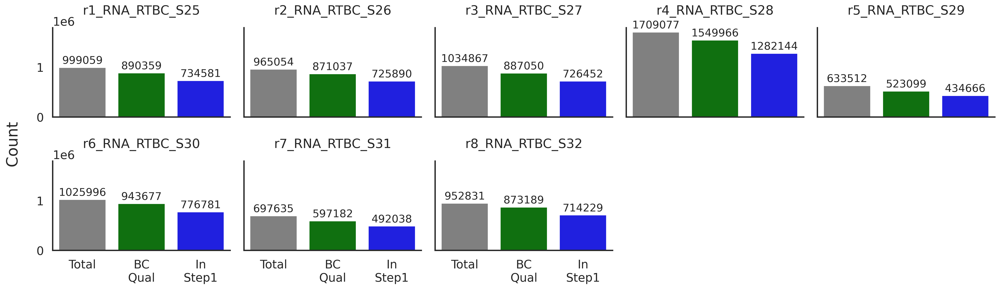

In [85]:
fig, axs = pipeline_err_corr.plot_trebl_experiment_loss([trebl_exp_RTBC], 
                                             "/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/err_corr/step1.csv")

## Auto error correction

In [5]:
pipeline_auto_err_corr = pipelines.TreblPipeline(db_path = "../../duckdb/NKX2-2_pipeline_test_err_corr.db",
                        design_file_path = "../../data/DNA_Tiles_nkx2_2.txt",
                        error_correction = True,
                        output_path = "../../output/NKX2-2/pipeline_test/auto_err_corr")

Reading 1 FASTQ/TXT file(s)...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.86 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.32 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 2.58 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.90 seconds.

trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 3.15 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 2.03 seconds.


=== Running error correction step on trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a2_RNA_ADBC_S18 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted.fastq
Wrote 769918 reads to /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/treb

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 244
Done in 0.74 seconds.

Whitelist application complete for trebl_experiment_a2_RNA_ADBC_S18 at trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_error_corrected
Done in 1.08 minutes.

Done.
Saved loss summary table as 'trebl_ex

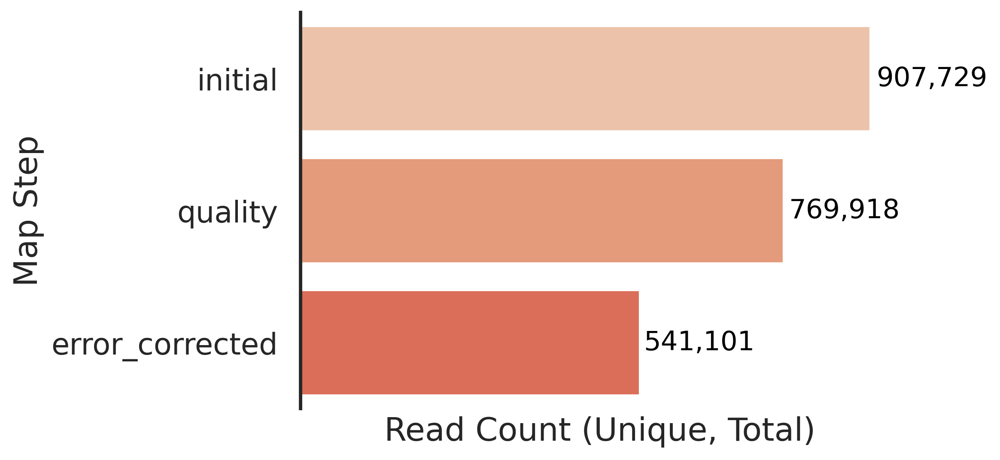

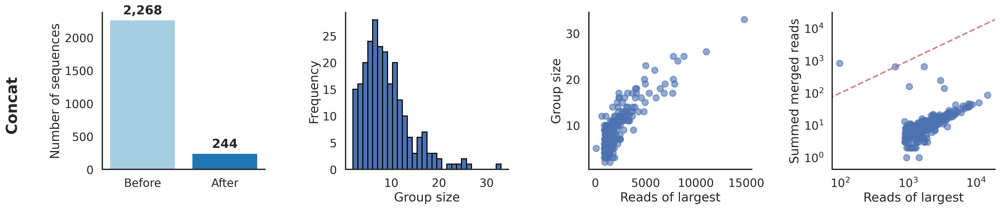

Done in 7.78 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq (541101 reads)...


Writing FASTQ: 100%|██████████| 541101/541101 [00:00<00:00, 719876.17it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.fastq
Done in 1.65 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a2_RNA_ADBC_S18_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_te

Done in 4.27 seconds.

Aligning .FASTQ to reference .FA ...


541101 reads; of these:
  541101 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    541101 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a2_RNA_ADBC_S18/a2_RNA_ADBC_S18_umi_deduplicated.bam
# job started at Fri Jan 16 11:53:08 2026 on n0120.savio2 -- d9466aa0-dc44-4cf0-b3d1-7bd1a1a7c15c
# pid: 118941, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 3.78 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.00 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 2.64 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.75 seconds.

trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_
Done in 2.23 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.48 seconds.


=== Running error correction step on trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a7_RNA_ADBC_S23 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_c

/global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/conda/umi_tools/lib/python3.12/site-packages/umi_tools/whitelist_methods.py:207: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  fig3.set_xlim(0, len(counts)*1.25)



Whitelist complete.
- Log: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.log
- Output: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_whitelist.txt
- Plots: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_filtered_barcodes_extracted_plots_*.png
Unique canonical barcodes: 61
Done in 0.75 seconds.

Whitelist application complete for trebl_experiment_a7_RNA_ADBC_S23 at trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_error_corrected
Done in 34.10 seconds.

Done.
Saved loss summary table as 'trebl_ex

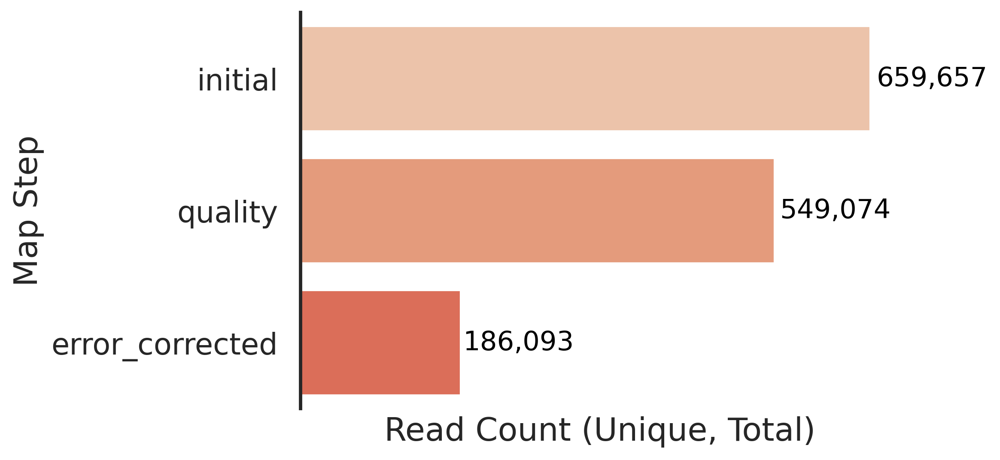

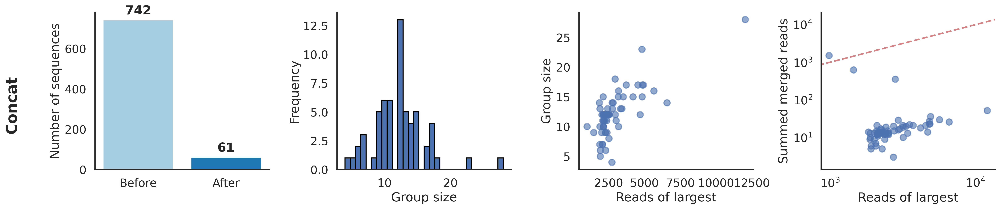

Done in 6.59 seconds.

Starting simple deduplication.
Finished simple deduplication.

Starting UMI Tools directional deduplication.
Generating FASTQ with UMIs in header and barcodes as sequence...
Writing FASTQ to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq (186093 reads)...


Writing FASTQ: 100%|██████████| 186093/186093 [00:00<00:00, 695691.71it/s]


FASTQ complete: ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.fastq
Done in 0.57 seconds.

Saving unique barcode(s) as reference file...
Creating table of unique concatenated barcodes: trebl_experiment_a7_RNA_ADBC_S23_ADBC2_HawkBCs_unique_barcodes
Writing FASTA to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes.fa...
Indexing FASTA with bowtie2-build, prefix: ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index


Building a SMALL index
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2.tmp to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.3.bt2
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2.tmp to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.4.bt2
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.1.bt2.tmp to ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.1.bt2
Renaming ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_barcodes_index.2.bt2.tmp to ../../output/NKX2-2/pipeline_te

Done in 2.79 seconds.

Aligning .FASTQ to reference .FA ...


186093 reads; of these:
  186093 (100.00%) were unpaired; of these:
    0 (0.00%) aligned 0 times
    186093 (100.00%) aligned exactly 1 time
    0 (0.00%) aligned >1 times
100.00% overall alignment rate


Converting SAM -> BAM ...
Sorting BAM ...


[bam_sort_core] merging from 0 files and 32 in-memory blocks...


Indexing BAM ...
Deduplicating UMIs ...
# UMI-tools version: 1.1.6
# output generated by dedup -I ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_extracted.sorted.bam -S ../../output/NKX2-2/pipeline_test/auto_err_corr/figures/trebl_experiment_a7_RNA_ADBC_S23/a7_RNA_ADBC_S23_umi_deduplicated.bam
# job started at Fri Jan 16 11:56:07 2026 on n0120.savio2 -- 365e7ac4-6a02-4a8a-b578-a369c4b3faac
# pid: 119281, system: Linux 4.18.0-553.34.1.el8_10.x86_64 #1 SMP Wed Jan 8 14:44:18 UTC 2025 x86_64
# assigned_tag                            : None
# cell_tag                                : None
# cell_tag_delim                          : None
# cell_tag_split                          : -
# chimeric_pairs                          : use
# chrom                                   : None
# compresslevel                           : 6
# detection_method                        : None
# filter_umi                              : None
# gene_tag

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.33 seconds.

Reverse complement of sequences...


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

Done in 4.32 seconds.

Extracting 2 barcodes...
Regex for ADBC2: TATGCTAT(.*)GGCCGGCCG
Regex for HawkBCs: TAGC(.*)CTCGAGA
Done in 2.50 seconds.

Extracting UMI...
UMI: extracting last 12 bases
Done in 0.83 seconds.

trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_
Done in 2.31 seconds.

Mapping complete.
Base prefix (stable across descriptors): trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_
Full prefix for this instance: trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_

Using the following step order:
1. initial
2. quality
3. error_corrected


Filtering to high-quality reads...
Created table: trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_quality — filtered for TRUE in all *_qual columns.
Done in 1.77 seconds.


=== Running error correction step on trebl_experiment_a1_RNA_ADBC_S17_ADBC2_HawkBCs_quality ===

=== Applying whitelist for trebl_experiment_a1_RNA_ADBC_S17 ===
Generating FASTQ: /global/scratch/projects/fc_mvslab/OpenProjects/Sanjana/TREBL/output/NKX2-2/pipeline_test/auto_err_c


KeyboardInterrupt



In [10]:
trebl_exp_results_auto_err_corr = pipeline_auto_err_corr.trebl_experiment_analysis(
        AD_seq_files = AD_seq_files,
        AD_bc_objects = [trebl_exp_ADBC2, trebl_exp_HawkBCs],
        RT_seq_files = RT_seq_files,
        RT_bc_objects = [trebl_exp_RTBC],
        reverse_complement = True,
        AD_umi_object = UMI,
        RT_umi_object = UMI,
        reads_threshold_AD=1,
        reads_threshold_RT=1
    )